In [3]:
import pyscenic

In [5]:
pyscenic.__version__

'0.11.2'

In [211]:
import scanpy as sc

import os
import numpy as np
import pandas as pd
import loompy as lp


from MulticoreTSNE import MulticoreTSNE as TSNE

import seaborn as sns
import matplotlib.pyplot as plt

adata = sc.read_loom('./pyscenic_100x_1.loom')

import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
1+1

In [212]:
sc.settings.njobs = 20

In [213]:
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

In [63]:
adata.obs['subcluster']

Stanford_5846N1-total_AAACCTGCAATGGATA             Chief
Stanford_5846N1-total_AAAGATGGTTCCACAA          PG/Neck1
Stanford_5846N1-total_AAATGCCGTTCACCTC             GKN+F
Stanford_5846N1-total_AAATGCCTCTATCCCG          PG/Neck1
Stanford_5846N1-total_AACTCCCAGCATCATC          PG/Neck2
                                                ...     
Tsinghua_12320058M-total_TTTGTCAAGGGAAACA    ADH1+GKN1-F
Tsinghua_12320058M-total_TTTGTCACACTGTCGG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCACAGTTCCCT          GKN+F
Tsinghua_12320058M-total_TTTGTCAGTGGTAACG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCAGTGTGAAAT         Pr_epi
Name: subcluster, Length: 39169, dtype: object

In [214]:
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata.var.index) ,
}
col_attrs = {
    "CellID": np.array(adata.obs.index) ,
    "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
}

In [65]:
lp.create('pyscenic_100x_2.loom', adata.X.transpose(), row_attrs,col_attrs)

In [66]:
f_tfs = "../allTFs_hg38.txt" # human

In [67]:
from arboreto.utils import load_tf_names

In [72]:
tf_names = load_tf_names( f_tfs )

In [ ]:
%%bash
for i in `seq 5`
do
    pyscenic grn pyscenic_100x_2.loom ../allTFs_hg38.txt -o scenic_100times/adj_$i.csv --transpose --num_workers 20 
    pyscenic ctx scenic_100times/adj_$i.csv ../scenic/hg38__refseq-r80__10kb_up_and_down_tss.mc9nr.feather \
    --annotations_fname ../scenic/motifs-v9-nr.hgnc-m0.001-o0.0.tbl \
    --expression_mtx_fname pyscenic_100x_2.loom \
    --output scenic_100times/reg_$i.csv --num_workers 15 \
    --mask_dropouts  
done

In [502]:
%%bash
for i in `seq 5`
do
    echo $[$i+5]
done

6
7
8
9
10


In [74]:
1+1

2

In [75]:
from collections import Counter
import pandas as pd
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons

In [79]:
import os

In [80]:
!pwd

/data/tsubosaka/integrated_data/論文用再検討/修正/fig作成用


In [82]:
motifs = []

for i in range(1, 5):
    motifs.append(load_motifs(f'./scenic_100times/reg_{i}.csv'))


In [83]:
motifs[0]

Enrichment            \
                                                      AUC       NES   
TF      MotifID                                                       
ATF1    dbcorrdb__BRCA1__ENCSR000EDB_1__m1       0.058718  4.034974   
        cisbp__M0294                             0.052188  3.071692   
ATF3    taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL   0.052878  3.573581   
        transfac_pro__M01186                     0.049726  3.043689   
        transfac_pro__M03866                     0.050363  3.150909   
...                                                   ...       ...   
TFDP1   transfac_pro__M04823                     0.073148  8.058061   
        transfac_pro__M00427                     0.068268  7.291717   
TGIF1   transfac_public__M00039                  0.040879  3.028917   
        cisbp__M3083                             0.041206  3.103599   
ZDHHC15 hdpi__ZDHHC15                            0.071487  3.681725   

                                                                      \
                                               MotifSimilarityQvalue   
TF      MotifID                                                        
ATF1    dbcorrdb__BRCA1__ENCSR000EDB_1__m1                  0.000112   
        cisbp__M0294                                        0.000000   
ATF3    taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL              0.000000   
        transfac_pro__M01186                                0.000074   
        transfac_pro__M03866                                0.000532   
...                                                              ...   
TFDP1   transfac_pro__M04823                                0.000014   
        transfac_pro__M00427                                0.000088   
TGIF1   transfac_public__M00039                             0.000780   
        cisbp__M3083                                        0.000754   
ZDHHC15 hdpi__ZDHHC15                                       0.000000   

                                                                    \
                                               OrthologousIdentity   
TF      MotifID                                                      
ATF1    dbcorrdb__BRCA1__ENCSR000EDB_1__m1                1.000000   
        cisbp__M0294                                      0.918216   
ATF3    taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL            1.000000   
        transfac_pro__M01186                              1.000000   
        transfac_pro__M03866                              1.000000   
...                                                            ...   
TFDP1   transfac_pro__M04823                              1.000000   
        transfac_pro__M00427                              1.000000   
TGIF1   transfac_public__M00039                           0.144928   
        cisbp__M3083                                      0.144928   
ZDHHC15 hdpi__ZDHHC15                                     1.000000   

                                                                                                   \
                                                                                       Annotation   
TF      MotifID                                                                                     
ATF1    dbcorrdb__BRCA1__ENCSR000EDB_1__m1      gene is annotated for similar motif dbcorrdb__...   
        cisbp__M0294                            motif is annotated for orthologous gene ENSMUS...   
ATF3    taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL  motif similar to taipale_cyt_meth__ATF3_NRTGAY...   
        transfac_pro__M01186                    gene is annotated for similar motif taipale_cy...   
        transfac_pro__M03866                    gene is annotated for similar motif homer__DAT...   
...                                                                                           ...   
TFDP1   transfac_pro__M04823                    gene is annotated for similar motif hocomoco__...   
        transfac_pro__M00427                    gene

In [84]:
# Collect regulons
regulons = []
for regulons_l in map(df2regulons, motifs):
    single = None
    for r in regulons_l:
        ks = []
        for k, v in r.gene2weight.items():
            ks += [k]
        single = pd.concat([single, pd.DataFrame({r.name: ks})], axis=1)
    regulons.append(single.fillna(''))

Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [88]:
regulons[0]

,AR(+),ARID3A(+),ARNT(+),ARNT2(+),ARNTL2(+),ASCL1(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),...,ZNF607(+),ZNF623(+),ZNF768(+),ZNF778(+),ZNF835(+),ZNF91(+),ZSCAN16(+),ZSCAN21(+),ZSCAN31(+),ZSCAN9(+)
0,AGPAT3,KAZALD1,ARFGEF2,RALYL,KLHL12,MIAT,CDK12,SYT11,PAK1,SLC7A11,...,SATB1,FADS3,DAG1,DGKH,MCF2L,BSCL2,MPV17,CYP2E1,ZSCAN31,IKZF4
1,TNFRSF19,CAMK2G,AUTS2,NKX2-2,TRIP6,ZBTB20,MXI1,TIMM10B,VPS37B,DDIT4,...,ZFHX2,THRB,ARID3B,VEGFA,C2CD2,MFSD11,PARP12,KCNAB1,B3GALNT1,DUS3L
2,MECOM,SPRY2,SNAP29,RAD9A,RARG,PLEKHB1,SCAMP5,CLDN6,UBE2H,CHAC1,...,MLLT6,RAP1GAP,QTRT1,RHOU,RHBDF2,SDF4,ITGAL,ZNF362,EPB41L1,ABCA1
3,ELOVL7,PWWP2B,BHLHE41,MAPK10,RRAGC,CRIP2,FUBP1,ZNF438,DUSP1,SPTY2D1,...,ZFHX3,RERE,SHCBP1,PHACTR2,COL4A2,DDX6,RAPGEF1,VPS13B,HSPB8,
4,COBLL1,B4GALNT3,COPS7A,OTUD7B,SLC16A1,PAK3,ANKFY1,CBWD2,TEAD1,SLC38A2,...,SORBS1,CXCL5,WDTC1,KIAA2026,EEFSEC,TSC1,FAIM,MATN1-AS1,SSTR1,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,,,,,,,,,,,...,,,,,,,,,,
2083,,,,,,,,,,,...,,,,,,,,,,
2084,,,,,,,,,,,...,,,,,,,,,,
2085,,,,,,,,,,,...,,,,,,,,,,


In [89]:
regulons[1]

,ARID3A(+),ARID5B(+),ARNT(+),ARNT2(+),ARX(+),ASCL1(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),...,ZNF76(+),ZNF768(+),ZNF787(+),ZNF8(+),ZNF823(+),ZNF835(+),ZSCAN16(+),ZSCAN31(+),ZSCAN4(+),ZSCAN9(+)
0,KCNMA1,NR4A3,ARFGEF2,RAD9A,HELT,ZBTB20,DHX40,TIMM10B,JUNB,SLC3A2,...,NELFE,RERE,RELA,DACH1,FUT1,MCF2L,MPV17,ZSCAN31,PLEKHN1,IKZF4
1,VPS36,ATXN1,MAFG,RALYL,PPP1R1A,MIAT,HIVEP2,PTPRM,PCGF5,CHAC1,...,UMAD1,UBTF,ZBTB7A,TNRC6C,UBTF,C2CD2,PARP12,B3GALNT1,ACAP3,DUS3L
2,KAZALD1,ARHGAP21,AUTS2,NKX2-2,PAX4,PLEKHB1,MAPK8,TMEM120B,ANXA1,SLC38A2,...,APOM,DAG1,MYH14,UTP6,LBH,RHBDF2,ITGAL,EPB41L1,BBC3,ABCA1
3,VAV2,PRDM12,ZNF566,IP6K1,TAC3,CRIP2,SYT11,BTAF1,LMNA,MKNK2,...,GPATCH2L,FAM222B,SEMA6B,MAPK4,CMIP,COL4A2,TMPRSS13,HSPB8,SCNN1B,CERS5
4,CAMK2G,FHL2,METAP1D,MAPK10,SMARCA2,KIF1A,IRGQ,GOLGA1,PDE2A,DDIT4,...,THOC5,QTRT1,ZFPM1,SOS1,PHF23,EEFSEC,RAPGEF1,SSTR1,DEFB1,MRO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2337,,,,,,,,,,,...,,,,,,,,,,
2338,,,,,,,,,,,...,,,,,,,,,,
2339,,,,,,,,,,,...,,,,,,,,,,
2340,,,,,,,,,,,...,,,,,,,,,,


In [90]:
regulons[2]

,AEBP2(+),ARID3A(+),ARNT(+),ARNT2(+),ARX(+),ASCL1(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),...,ZNF669(+),ZNF675(+),ZNF740(+),ZNF76(+),ZNF778(+),ZNF823(+),ZNF83(+),ZNF835(+),ZNF845(+),ZSCAN16(+)
0,PLAGL1,KAZALD1,ARFGEF2,RALYL,HELT,ZBTB20,ZBTB25,RCC2,NPAS4,LONRF3,...,TCP11L2,ZFHX2,AGO1,NELFE,DGKH,FUT1,KCNN4,MCF2L,NR1D1,MPV17
1,RASSF2,CAMK2G,NR1D1,RAD9A,NYAP1,MIAT,ELFN2,SYT11,JUNB,CRTAC1,...,FURIN,ZMYM1,CAMP,GPATCH2L,VEGFA,UBTF,ARHGEF1,C2CD2,ATXN7L1,PARP12
2,STX11,SPRY2,BHLHE41,IP6K1,KCNMA1,PLEKHB1,IRF2,JDP2,PCGF5,PAK1,...,GSE1,C5orf34,LRRC20,THOC5,RHOU,LBH,TNR,RHBDF2,GRM5,ITGAL
3,RHBDL2,PWWP2B,AGTRAP,MAPK10,AQP3,CRIP2,NUP50,NFIL3,ANXA1,MIR22HG,...,SOBP,,XPO4,APPL2,KIAA2026,,KCNQ3,COL4A2,DNAJC13,TMPRSS13
4,RTN4R,B4GALNT3,LATS2,OTUD7B,PPP1R1A,KIF1A,COLGALT2,SLAIN2,LMNA,CHAC1,...,LHFPL4,,BCKDK,USPL1,CCSER2,,FMN1,EEFSEC,HECA,RAPGEF1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2458,,,,,,,,,,,...,,,,,,,,,,
2459,,,,,,,,,,,...,,,,,,,,,,
2460,,,,,,,,,,,...,,,,,,,,,,
2461,,,,,,,,,,,...,,,,,,,,,,


In [100]:
# Get regulons identified at least in 2 runs (out of 3)
columns = Counter([
    e for l in map(lambda x: list(x.columns), regulons) for e in l
])
columns = [e for e in columns if columns[e] > 3]

# Get target genes identified at least in 2 runs for each regulons
stable_regulons = None
for c in columns:
    targets = []
    for r in regulons:
        if c in r.columns:
           targets.extend(filter(lambda x: x != '', r[c]))
    targets = Counter(targets)
    targets = [e for e in targets if targets[e] > 3] 
    stable_regulons = pd.concat([
        stable_regulons, pd.DataFrame({c: targets})
    ], axis=1) 

# List of target genes per stable regulons
stable_regulons.to_csv(f'./scenic_100times/regulons.final.csv', index=False)

# Input data for AUCell
with open(f'./scenic_100times/regulons.final.gmt', 'wt') as gmt:
    for c in stable_regulons.columns:
        genes = '\t'.join(stable_regulons.loc[:, c].dropna())
        gmt.write(f'{c}\tRegulon_{c}\t{genes}\n')

In [107]:
!pwd

/data/tsubosaka/integrated_data/論文用再検討/修正/fig作成用


In [115]:
import json
import zlib
import base64


In [106]:
%%bash
for i in `seq 5`
do
    pyscenic aucell \
    ./pyscenic_100x_2.loom \
    scenic_100times/reg_$i.csv \
    --output ./scenic_100times/pyscenic_100x_3_$i.loom \
    --num_workers 15
done

Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []
Create regulons from a dataframe of enriched features.
Additional columns saved: []



2021-10-19 11:57:03,937 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-10-19 11:57:21,255 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.

2021-10-19 11:57:38,978 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2021-10-19 12:01:37,771 - pyscenic.cli.pyscenic - INFO - Writing results to file.

2021-10-19 12:17:41,116 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-10-19 12:17:58,083 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.

2021-10-19 12:18:17,096 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2021-10-19 12:22:26,576 - pyscenic.cli.pyscenic - INFO - Writing results to file.

2021-10-19 12:37:26,801 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-10-19 12:37:43,333 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.

2021-10-19 12:38:00,591 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2021-10-19 12:41:59,059 - pyscenic.cli.pyscenic - INFO -

In [176]:
'pyscenic_100x_3_'+str(1)+'.loom'

'pyscenic_100x_3_1.loom'

In [202]:
def plot_RSS_and_top20_matrix(i):
    import scanpy as sc

    import os
    import numpy as np
    import pandas as pd
    import loompy as lp


    from MulticoreTSNE import MulticoreTSNE as TSNE

    import seaborn as sns
    import matplotlib.pyplot as plt


    import seaborn as sns
    import matplotlib.pyplot as plt
    from collections import Counter
    import pandas as pd
    from pyscenic.utils import load_motifs
    from pyscenic.transform import df2regulons
    adata = sc.read_loom('./pyscenic_100x_1.loom')
    
    lf = lp.connect('./scenic_100times/pyscenic_100x_3_'+str(i)+'.loom', mode='r+', validate=False )
    auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

    
    from collections import Counter
    import pandas as pd
    from pyscenic.utils import load_motifs
    from pyscenic.transform import df2regulons
    
    # create a dictionary of regulons:
    #regulons = {}
    #for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
     #   regulons[i] =  list(r[r==1].index.values)
    
    
    
    auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
    #regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
    # regulon thresholds
    #rt = meta['regulonThresholds']
    #for i,x in enumerate(rt):
     #   tmp = x.get('regulon').replace("(","_(")
      #  x.update( {'regulon': tmp} )
        
    
    ### metadata
    metaJson = {}

    metaJson['embeddings'] = [
        {
            "id": 1,
            "name": "monocle3 umap"
        },
        {
            "id": 2,
            "name": "SCENIC AUC UMAP"
        },
    ]
    
    metaJson["regulonThresholds"] = rt
    
    def dfToNamedMatrix(df):
        arr_ip = [tuple(i) for i in df.values]
        dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
        arr = np.array(arr_ip, dtype=dtyp)
        return arr
    
    col_attrs = {
        "CellID": np.array(adata.obs.index),
  #  "nUMI": np.array(adata.obs['n_counts'].values),
   # "nGene": np.array(adata.obs['n_genes'].values),
    #"Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
 #   "Percent_mito": np.array(adata.obs['percent_mito'].values),
 #   "Embedding": dfToNamedMatrix(tsneDF),
#    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
 #   "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
        "RegulonsAUC": dfToNamedMatrix(auc_mtx),
 #   "Clusterings": dfToNamedMatrix(clusterings),
  #  "ClusterID": np.array(adata.obs['louvain'].values)
}

    # create a dictionary of regulons:
    regulons = {}
    for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
        regulons[i] =  list(r[r==1].index.values)
        
    row_attrs = {
        "Gene": lf.ra.Gene,
        "Regulons": regulons,
    }

    attrs = {
        "title": "sampleTitle",
#        "MetaData": json.dumps(metaJson),
        "Genome": 'hg38',
        "SCopeTreeL1": "",
        "SCopeTreeL2": "",
        "SCopeTreeL3": ""
    }
    lf.close()
    
    # compress the metadata field:
    attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')
    
    filename1 = './scenic_100times/pyscenic_100x_4_'+str(1)+'.loom'
    lp.create(
        filename = filename1,
        layers=lf[:,:],
        row_attrs=row_attrs, 
        col_attrs=col_attrs, 
        file_attrs=attrs
    )
    lf.close() # close original pyscenic loom file
    
    # import dependencies
    import os
    import numpy as np
    import pandas as pd
    import scanpy as sc
    import loompy as lp
    from MulticoreTSNE import MulticoreTSNE as TSNE
    import json
    import base64
    import zlib
    from pyscenic.plotting import plot_binarization
    from pyscenic.export import add_scenic_metadata
    from pyscenic.cli.utils import load_signatures
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    #from scanpy.plotting._tools.scatterplots import plot_scatter
    import seaborn as sns
    
    f_final_loom = filename1
    
    # scenic output
    lf = lp.connect( f_final_loom, mode='r', validate=False )
    meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
    exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
    auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
    

        
        
    # load the regulons from a file using the load_signatures function
    sig = load_signatures('./scenic_100times/reg_'+str(i)+'.csv')
    adata = add_scenic_metadata(adata, auc_mtx, sig)
    # helper functions (not yet integrated into pySCENIC):

    from pyscenic.utils import load_motifs
    import operator as op
    from IPython.display import HTML, display

    BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
    COLUMN_NAME_LOGO = "MotifLogo"
    COLUMN_NAME_MOTIF_ID = "MotifID"
    COLUMN_NAME_TARGETS = "TargetGenes"

    df_motifs = load_motifs('./scenic_100times/reg_'+str(i)+'.csv')
    
    
    def colorMap( x, palette='bright' ):
        import natsort
        from collections import OrderedDict
        #
        n=len(set(x))
        cpalette = sns.color_palette(palette,n_colors=n )
        cdict = dict( zip( list(set(x)), cpalette ))
        cmap = [ cdict[i] for i in x ]
        cdict = OrderedDict( natsort.natsorted(cdict.items()) )
        return cmap,cdict

    def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
        cmap,cdict = colorMap( colorlab, palette )
        for lab,col in cdict.items():  
            ix = colorlab.loc[colorlab==lab].index
            ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
        if( title is not None ):
            ax.set_title(title, fontsize='x-large');
    #
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        
        
    from pyscenic.rss import regulon_specificity_scores
    from pyscenic.plotting import plot_rss
    import matplotlib.pyplot as plt
    from adjustText import adjust_text
    import seaborn as sns
    from pyscenic.binarization import binarize

    cell_types = list(adata.obs['subcluster'].unique())
    n_types = len(cell_types)
    regulons = list(auc_mtx.columns)
    n_regulons = len(regulons)
    rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

    from scipy.spatial.distance import jensenshannon
    from math import sqrt

    from adjustText import adjust_text

    from pyscenic.rss import regulon_specificity_scores
    from pyscenic.plotting import plot_rss
    import matplotlib.pyplot as plt
    from adjustText import adjust_text
    import seaborn as sns
    from pyscenic.binarization import binarize

    cell_types = list(adata.obs['subcluster'].unique())
    n_types = len(cell_types)
    regulons = list(auc_mtx.columns)
    n_regulons = len(regulons)
    rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

    from scipy.spatial.distance import jensenshannon
    from math import sqrt
    
    
    cats = rss_cellType.index
    cats = sorted(list(set(adata.obs['subcluster'])))
    
    
    #cats = sorted(list(set(adata.obs['subcluster'])))

    fig = plt.figure(figsize=(15, 10))
    for c,num in zip(cats, range(1,len(cats)+1)):
        x=rss_cellType.T[c]
        ax = fig.add_subplot(3,5,num)
        plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
        ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
        ax.set_ylabel('')
        ax.set_xlabel('')
        adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
    fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
    fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
    plt.tight_layout()
    plt.rcParams.update({
        'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
    #plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
    plt.show()
    
    top20 = pd.DataFrame()

    for i in range(len(pd.DataFrame(rss_cellType).index)):
        top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(100).index)],axis=1)

    top20.columns = pd.DataFrame(rss_cellType).index

    top20 = top20.reindex(sorted(top20.columns), axis=1)
    
    return (top20)

In [177]:
sig = load_signatures('./scenic_100times/reg_'+str(3)+'.csv')

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [188]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

AttributeError: 'NoneType' object has no attribute 'Regulons'

In [109]:

# collect SCENIC AUCell output
lf = lp.connect('./scenic_100times/pyscenic_100x_3_1.loom', mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [125]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

In [129]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": 1,
        "name": "monocle3 umap"
    },
    {
        "id": 2,
        "name": "SCENIC AUC UMAP"
    },
]


# SCENIC regulon thresholds:


In [130]:
metaJson["regulonThresholds"] = rt

In [131]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [137]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
  #  "nUMI": np.array(adata.obs['n_counts'].values),
   # "nGene": np.array(adata.obs['n_genes'].values),
    #"Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
 #   "Percent_mito": np.array(adata.obs['percent_mito'].values),
 #   "Embedding": dfToNamedMatrix(tsneDF),
#    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
 #   "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
 #   "Clusterings": dfToNamedMatrix(clusterings),
  #  "ClusterID": np.array(adata.obs['louvain'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [138]:
lp.create(
    filename = './scenic_100times/pysceic_100x_4_1.loom' ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

In [139]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
#from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

In [144]:
f_final_loom = './scenic_100times/pysceic_100x_4_1.loom'

In [145]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [146]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [147]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [148]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

cellAnnot = pd.concat(
    [
#        pd.DataFrame( lf.ca.Celltype_Garnett, index=lf.ca.CellID ),
#        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Louvain_clusters_Scanpy, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
 'Celltype_Garnett',
# 'ClusterID',
 'Louvain_clusters_Scanpy',
 'Percent_mito',
 'nGene',
 'nUMI']

In [150]:
lf.close()


In [152]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('./scenic_100times/reg_1.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [154]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [153]:
df_motifs = load_motifs('./scenic_100times/reg_1.csv')

#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [156]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.rcParams.update({'font.size':12})

fig, ax2 = plt.subplots(figsize=(17,10), dpi=150 )

#drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax2, palette=colors,s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

#plt.tight_layout()
#plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [162]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [163]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [164]:
# 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
rss_cellType

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARNTL2_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF607_(+),ZNF623_(+),ZNF768_(+),ZNF778_(+),ZNF835_(+),ZNF91_(+),ZSCAN16_(+),ZSCAN21_(+),ZSCAN31_(+),ZSCAN9_(+)
Chief,0.249707,0.228037,0.241780,0.187057,0.229456,0.227497,0.230484,0.238837,0.219954,0.210159,...,0.213556,0.207242,0.229093,0.209196,0.195322,0.233255,0.233736,0.193363,0.186448,0.183863
PG/Neck1,0.300614,0.262290,0.263049,0.203925,0.268278,0.257525,0.276721,0.280112,0.266216,0.248859,...,0.270571,0.260047,0.277518,0.252238,0.217513,0.266715,0.266544,0.212587,0.201932,0.196624
GKN+F,0.327357,0.462895,0.463330,0.211854,0.400684,0.374406,0.400256,0.380583,0.419417,0.450360,...,0.300791,0.292312,0.415367,0.308488,0.229634,0.403813,0.432246,0.184130,0.254322,0.194216
PG/Neck2,0.220678,0.196986,0.193745,0.188370,0.198078,0.203519,0.211575,0.208566,0.214193,0.206951,...,0.215544,0.213172,0.206990,0.200260,0.191996,0.200176,0.197304,0.188205,0.183736,0.190651
PC,0.230960,0.217686,0.231831,0.179330,0.225768,0.212514,0.216277,0.226775,0.206506,0.198288,...,0.203870,0.204964,0.215240,0.198576,0.185318,0.217801,0.220497,0.179136,0.228197,0.175269
Pr_epi,0.219310,0.247320,0.240589,0.206519,0.290677,0.217778,0.271275,0.255483,0.254453,0.250090,...,0.247166,0.255062,0.261421,0.208355,0.204438,0.246769,0.263342,0.189605,0.190909,0.198487
ADH1+GKN1-F,0.281790,0.285593,0.265242,0.218789,0.324667,0.242502,0.330840,0.313259,0.346468,0.352078,...,0.312192,0.302398,0.329214,0.288481,0.239380,0.282232,0.291866,0.200566,0.240280,0.220987
NE2,0.184778,0.193633,0.188728,0.207457,0.188798,0.251575,0.196757,0.196655,0.188719,0.183863,...,0.196212,0.191214,0.191851,0.184723,0.185025,0.194832,0.189606,0.179325,0.184618,0.179810
NE1,0.200625,0.256490,0.220033,0.291850,0.225747,0.334970,0.248298,0.248175,0.228454,0.214423,...,0.258024,0.228474,0.235634,0.208617,0.201249,0.233857,0.229526,0.194960,0.210597,0.190840
LEFTY1+ADH+F,0.179144,0.175886,0.174698,0.176216,0.181284,0.174854,0.182469,0.184724,0.187146,0.185149,...,0.183981,0.181812,0.181904,0.176835,0.177236,0.176489,0.178285,0.171620,0.171728,0.182774


In [73]:
from adjustText import adjust_text

from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [74]:
cell_types

['ADH1+GKN1-F',
 'GKN+F',
 'Chief',
 'NE1',
 'NE2',
 'PG/Neck1',
 'PC',
 'Pr_epi',
 'PG/Neck2',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [77]:
from adjustText import adjust_text


In [78]:
rss_cellType.index

Index(['ADH1+GKN1-F', 'GKN+F', 'Chief', 'NE1', 'NE2', 'PG/Neck1', 'PC',
       'Pr_epi', 'PG/Neck2', 'LEFTY1+ADH+F', 'Ent', 'Gob', 'LEFTY1+PG/Neck'],
      dtype='object')

In [167]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

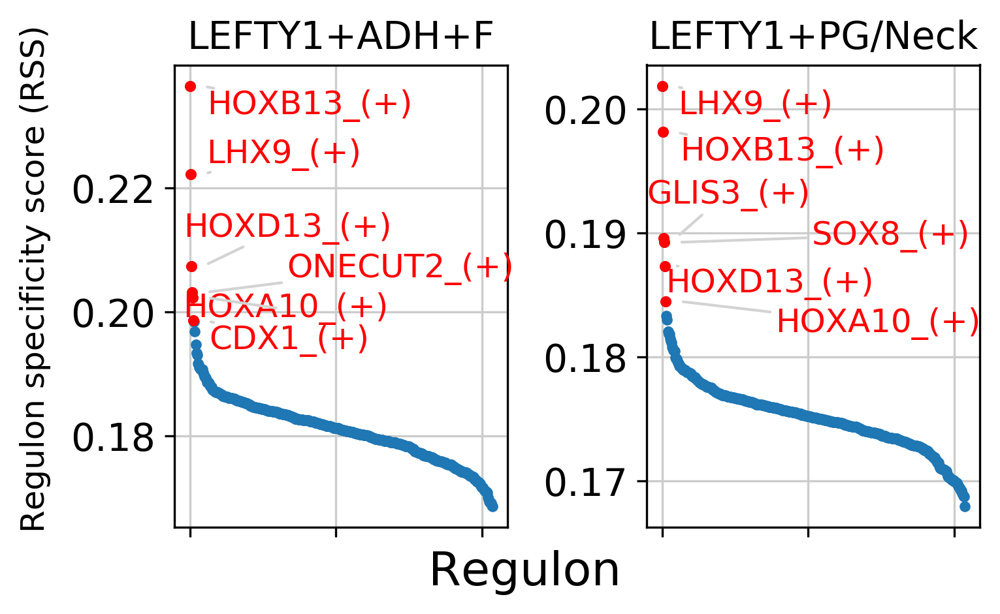

In [168]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_cellType, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [106]:
cats.remove('LEFTY1+ADH+F')

In [107]:
cats.remove('LEFTY1+PG/Neck')

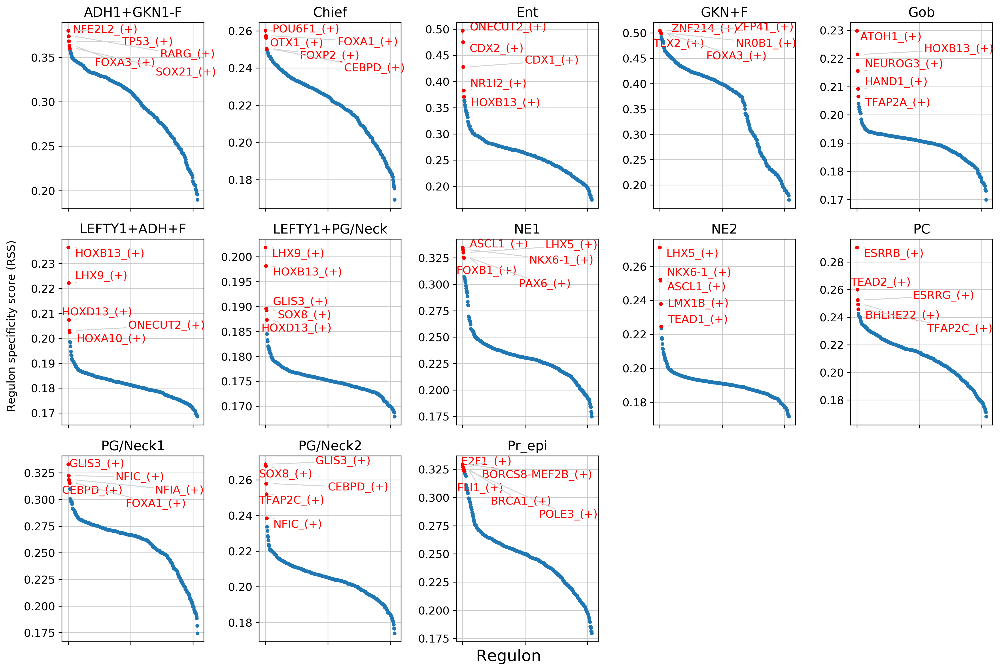

In [169]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [174]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(20).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

In [203]:
trial2 = plot_RSS_and_top20_matrix(2)

UnboundLocalError: local variable 'base64' referenced before assignment

# ２回め

In [ ]:
import scanpy as sc

import os
import numpy as np
import pandas as pd
import loompy as lp


from MulticoreTSNE import MulticoreTSNE as TSNE

import seaborn as sns
import matplotlib.pyplot as plt

adata = sc.read_loom('./pyscenic_100x_1.loom')

import seaborn as sns
import matplotlib.pyplot as plt

In [218]:
sc.settings.njobs = 20

In [219]:
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

In [217]:
1+1

2

In [220]:
adata.obs['subcluster']

Stanford_5846N1-total_AAACCTGCAATGGATA             Chief
Stanford_5846N1-total_AAAGATGGTTCCACAA          PG/Neck1
Stanford_5846N1-total_AAATGCCGTTCACCTC             GKN+F
Stanford_5846N1-total_AAATGCCTCTATCCCG          PG/Neck1
Stanford_5846N1-total_AACTCCCAGCATCATC          PG/Neck2
                                                ...     
Tsinghua_12320058M-total_TTTGTCAAGGGAAACA    ADH1+GKN1-F
Tsinghua_12320058M-total_TTTGTCACACTGTCGG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCACAGTTCCCT          GKN+F
Tsinghua_12320058M-total_TTTGTCAGTGGTAACG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCAGTGTGAAAT         Pr_epi
Name: subcluster, Length: 39169, dtype: object

In [221]:
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata.var.index) ,
}
col_attrs = {
    "CellID": np.array(adata.obs.index) ,
    "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
}

In [248]:
# scenic output
lf = lp.connect( './scenic_100times/pyscenic_100x_3_2.loom', mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )

In [249]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

In [250]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": 1,
        "name": "monocle3 umap"
    },
    {
        "id": 2,
        "name": "SCENIC AUC UMAP"
    },
]


# SCENIC regulon thresholds:


In [251]:
metaJson["regulonThresholds"] = rt

In [252]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [253]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
  #  "nUMI": np.array(adata.obs['n_counts'].values),
   # "nGene": np.array(adata.obs['n_genes'].values),
    #"Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
 #   "Percent_mito": np.array(adata.obs['percent_mito'].values),
 #   "Embedding": dfToNamedMatrix(tsneDF),
#    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
 #   "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
 #   "Clusterings": dfToNamedMatrix(clusterings),
  #  "ClusterID": np.array(adata.obs['louvain'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [254]:
lp.create(
    filename = './scenic_100times/pysceic_100x_4_2.loom' ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

In [255]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
#from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

In [256]:
f_final_loom = './scenic_100times/pysceic_100x_4_2.loom'

In [257]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [258]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [259]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [260]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

In [261]:
lf.close()


In [262]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('./scenic_100times/reg_2.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [263]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [264]:
df_motifs = load_motifs('./scenic_100times/reg_2.csv')

#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [265]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.rcParams.update({'font.size':12})

fig, ax2 = plt.subplots(figsize=(17,10), dpi=150 )

#drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax2, palette=colors,s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

#plt.tight_layout()
#plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [266]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [267]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [268]:
# 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
rss_cellType

,ARID3A_(+),ARID5B_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF76_(+),ZNF768_(+),ZNF787_(+),ZNF8_(+),ZNF823_(+),ZNF835_(+),ZSCAN16_(+),ZSCAN31_(+),ZSCAN4_(+),ZSCAN9_(+)
Chief,0.223672,0.224882,0.229457,0.192788,0.236830,0.228889,0.234140,0.215229,0.220179,0.205803,...,0.228134,0.225227,0.221297,0.229746,0.197154,0.244601,0.225265,0.186937,0.186221,0.243921
PG/Neck1,0.260415,0.275933,0.276545,0.217620,0.265145,0.260438,0.277870,0.251933,0.266257,0.251543,...,0.276797,0.276249,0.263023,0.274606,0.229495,0.268320,0.251525,0.202423,0.197939,0.246934
GKN+F,0.457619,0.405458,0.382456,0.233371,0.420835,0.373805,0.391047,0.253951,0.419555,0.412713,...,0.389571,0.403832,0.446821,0.404470,0.296862,0.499892,0.406413,0.253790,0.347972,0.436385
PG/Neck2,0.198784,0.221066,0.211695,0.190647,0.196181,0.209606,0.211305,0.208413,0.213826,0.214565,...,0.208157,0.209877,0.200109,0.205960,0.200945,0.186725,0.194497,0.183644,0.179495,0.183848
PC,0.216086,0.204727,0.210746,0.181528,0.222519,0.213388,0.221509,0.230746,0.206569,0.194689,...,0.213729,0.211230,0.214760,0.213186,0.190719,0.231998,0.217165,0.226385,0.191738,0.227896
Pr_epi,0.247363,0.258263,0.240798,0.214119,0.231257,0.226674,0.271830,0.246221,0.254247,0.247736,...,0.265747,0.258587,0.236683,0.256287,0.243626,0.235800,0.262262,0.191149,0.194805,0.224749
ADH1+GKN1-F,0.290707,0.347466,0.311184,0.239608,0.251912,0.259943,0.326074,0.288730,0.346573,0.358829,...,0.334095,0.336157,0.315757,0.321880,0.295189,0.253666,0.289980,0.239425,0.252199,0.225714
NE2,0.198742,0.190945,0.195007,0.204141,0.222577,0.256872,0.194559,0.195941,0.188806,0.184583,...,0.194883,0.192542,0.186804,0.193154,0.192868,0.189295,0.190160,0.185425,0.177971,0.186119
NE1,0.263206,0.232819,0.237317,0.285196,0.337782,0.336819,0.243178,0.251012,0.228888,0.219830,...,0.244361,0.237312,0.215845,0.234579,0.217925,0.220361,0.226772,0.218673,0.185829,0.210136
LEFTY1+ADH+F,0.176406,0.187447,0.179858,0.176684,0.172895,0.178631,0.182698,0.183143,0.186872,0.189635,...,0.183453,0.182862,0.179085,0.180366,0.180182,0.169990,0.181751,0.171459,0.171770,0.174211


In [269]:
from adjustText import adjust_text

from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [270]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [271]:
from adjustText import adjust_text


In [272]:
rss_cellType.index

Index(['Chief', 'PG/Neck1', 'GKN+F', 'PG/Neck2', 'PC', 'Pr_epi', 'ADH1+GKN1-F',
       'NE2', 'NE1', 'LEFTY1+ADH+F', 'Ent', 'Gob', 'LEFTY1+PG/Neck'],
      dtype='object')

In [273]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

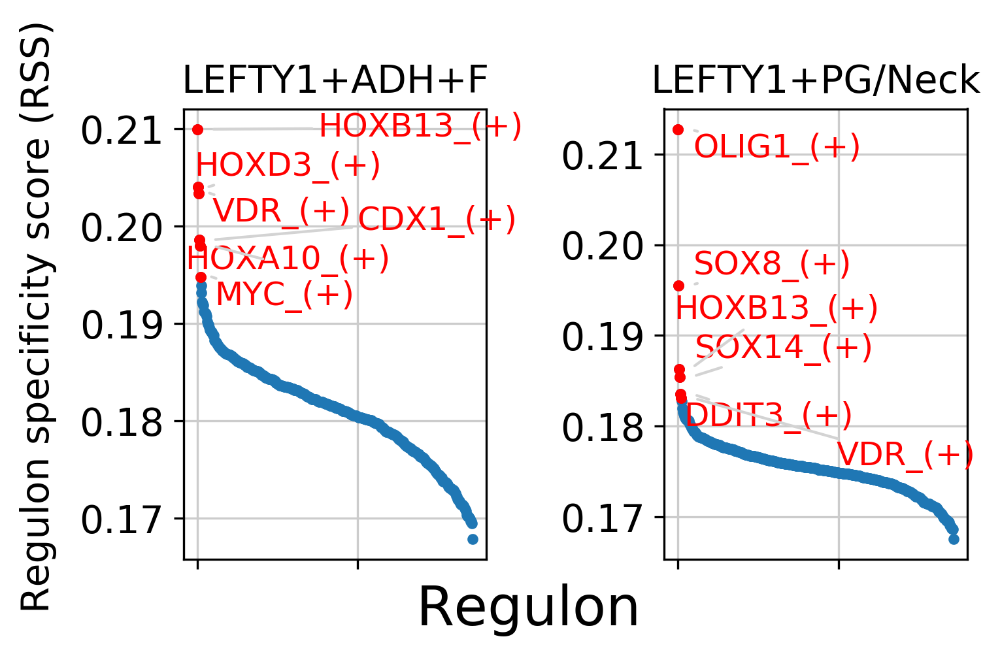

In [274]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_cellType, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

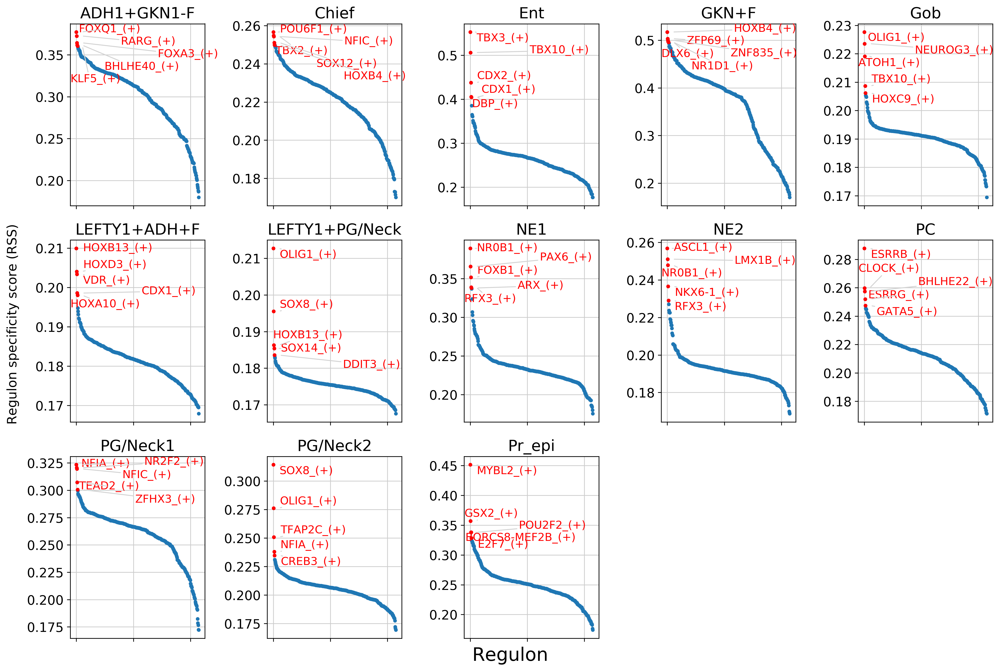

In [275]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [276]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(20).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

,ADH1+GKN1-F,Chief,Ent,GKN+F,Gob,LEFTY1+ADH+F,LEFTY1+PG/Neck,NE1,NE2,PC,PG/Neck1,PG/Neck2,Pr_epi
0,FOXQ1_(+),POU6F1_(+),TBX3_(+),HOXB4_(+),OLIG1_(+),HOXB13_(+),OLIG1_(+),NR0B1_(+),ASCL1_(+),ESRRB_(+),NFIA_(+),SOX8_(+),MYBL2_(+)
1,RARG_(+),TBX2_(+),TBX10_(+),ZFP69_(+),NEUROG3_(+),HOXD3_(+),SOX8_(+),PAX6_(+),LMX1B_(+),CLOCK_(+),NR2F2_(+),OLIG1_(+),GSX2_(+)
2,FOXA3_(+),NFIC_(+),CDX2_(+),ZNF835_(+),ATOH1_(+),VDR_(+),HOXB13_(+),FOXB1_(+),NR0B1_(+),BHLHE22_(+),NFIC_(+),TFAP2C_(+),BORCS8-MEF2B_(+)
3,BHLHE40_(+),SOX12_(+),DBP_(+),DLX6_(+),TBX10_(+),CDX1_(+),SOX14_(+),RFX3_(+),NKX6-1_(+),ESRRG_(+),TEAD2_(+),NFIA_(+),POU2F2_(+)
4,KLF5_(+),HOXB4_(+),CDX1_(+),NR1D1_(+),HOXC9_(+),HOXA10_(+),DDIT3_(+),ARX_(+),RFX3_(+),GATA5_(+),ZFHX3_(+),CREB3_(+),E2F7_(+)
5,SOX21_(+),NFIA_(+),HOXA13_(+),RORB_(+),HOXB13_(+),MYC_(+),VDR_(+),ASCL1_(+),TEAD1_(+),NFYC_(+),FOXA1_(+),DDIT3_(+),E2F1_(+)
6,ATF4_(+),ZFP69_(+),NR1I2_(+),LHX4_(+),HOXC11_(+),ETV4_(+),HOXC9_(+),LMX1B_(+),RORA_(+),TEAD2_(+),FOXP1_(+),NFIC_(+),BRCA1_(+)
7,HMGA1_(+),SETDB1_(+),HOXA9_(+),GATA2_(+),HOXA10_(+),HOXA9_(+),TFAP2C_(+),NKX6-1_(+),OLIG1_(+),KLF12_(+),GATA6_(+),FOXC2_(+),FLI1_(+)
8,BCL3_(+),SP5_(+),HOXC11_(+),KLF12_(+),CDX2_(+),HMGA1_(+),NFIA_(+),NEUROG3_(+),ARX_(+),NR2F2_(+),POU6F1_(+),HIVEP2_(+),TFDP1_(+)
9,NFKB1_(+),KLF12_(+),NR1I3_(+),LEF1_(+),SOX14_(+),CDX2_(+),NEUROG3_(+),TEAD1_(+),SOX2_(+),POLE4_(+),SOX2_(+),BCL6_(+),POLE3_(+)


In [278]:
top20.to_csv('./scenic_100times/top20_2.csv')

In [309]:
# scenic output
lf = lp.connect( './scenic_100times/pyscenic_100x_3_4.loom', mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )

In [310]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

In [311]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": 1,
        "name": "monocle3 umap"
    },
    {
        "id": 2,
        "name": "SCENIC AUC UMAP"
    },
]


# SCENIC regulon thresholds:


In [312]:
metaJson["regulonThresholds"] = rt

In [313]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [314]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
  #  "nUMI": np.array(adata.obs['n_counts'].values),
   # "nGene": np.array(adata.obs['n_genes'].values),
    #"Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
 #   "Percent_mito": np.array(adata.obs['percent_mito'].values),
 #   "Embedding": dfToNamedMatrix(tsneDF),
#    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
 #   "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
 #   "Clusterings": dfToNamedMatrix(clusterings),
  #  "ClusterID": np.array(adata.obs['louvain'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [315]:
lp.create(
    filename = './scenic_100times/pysceic_100x_4_4.loom' ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

In [316]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
#from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

In [317]:
f_final_loom = './scenic_100times/pysceic_100x_4_4.loom'

In [318]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [319]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [320]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [321]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

In [322]:
lf.close()


In [323]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('./scenic_100times/reg_4.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [324]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [325]:
df_motifs = load_motifs('./scenic_100times/reg_4.csv')

#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [326]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.rcParams.update({'font.size':12})

fig, ax2 = plt.subplots(figsize=(17,10), dpi=150 )

#drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax2, palette=colors,s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

#plt.tight_layout()
#plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [327]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [328]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [329]:
# 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
rss_cellType

,AEBP2_(+),AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ASCL2_(+),ATF1_(+),ATF2_(+),...,ZNF577_(+),ZNF607_(+),ZNF697_(+),ZNF71_(+),ZNF761_(+),ZNF799_(+),ZNF83_(+),ZNF835_(+),ZNF841_(+),ZSCAN16_(+)
Chief,0.187811,0.193957,0.232703,0.232051,0.191315,0.225966,0.235113,0.226457,0.190001,0.221121,...,0.226402,0.201002,0.238282,0.238959,0.227187,0.229749,0.234063,0.243471,0.241500,0.231793
PG/Neck1,0.211716,0.206095,0.263313,0.273637,0.216912,0.267169,0.267736,0.294364,0.210796,0.264248,...,0.279747,0.230881,0.273732,0.271647,0.265847,0.273618,0.268215,0.249879,0.279687,0.250962
GKN+F,0.244288,0.203252,0.473633,0.412133,0.227784,0.348878,0.411657,0.288341,0.245629,0.279409,...,0.299252,0.237943,0.450842,0.425035,0.434808,0.388161,0.462997,0.435122,0.447439,0.386771
PG/Neck2,0.191250,0.193362,0.196960,0.206983,0.188738,0.208644,0.208158,0.240655,0.200220,0.213704,...,0.215702,0.211464,0.203689,0.202193,0.200280,0.215729,0.196956,0.183501,0.199902,0.197438
PC,0.185599,0.183782,0.222786,0.219634,0.182853,0.220278,0.219877,0.209117,0.190454,0.227249,...,0.210459,0.187197,0.232198,0.250399,0.210650,0.228494,0.220888,0.228054,0.224498,0.220688
Pr_epi,0.237284,0.190985,0.245124,0.250462,0.203787,0.267635,0.232611,0.267387,0.242193,0.246502,...,0.246336,0.201163,0.229430,0.243190,0.248392,0.239502,0.240794,0.222189,0.244447,0.253246
ADH1+GKN1-F,0.269704,0.212085,0.283329,0.320144,0.232735,0.300369,0.262449,0.350518,0.251668,0.302263,...,0.319880,0.249989,0.270609,0.274844,0.308682,0.303995,0.278358,0.231697,0.286574,0.255534
NE2,0.181178,0.172893,0.194662,0.196250,0.198254,0.221793,0.241171,0.201293,0.185170,0.201205,...,0.202147,0.198703,0.191561,0.187964,0.187187,0.191357,0.190411,0.186208,0.189384,0.188369
NE1,0.206071,0.186482,0.255074,0.244569,0.253143,0.327332,0.303504,0.251741,0.217090,0.254523,...,0.261504,0.250414,0.244497,0.220580,0.227170,0.241000,0.229322,0.206325,0.230076,0.217458
LEFTY1+ADH+F,0.180915,0.176505,0.174889,0.179994,0.176663,0.184847,0.177281,0.193851,0.177326,0.183386,...,0.182334,0.180240,0.174411,0.180802,0.178704,0.181247,0.174747,0.172291,0.174708,0.177436


In [330]:
from adjustText import adjust_text

from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [331]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [332]:
from adjustText import adjust_text


In [333]:
rss_cellType.index

Index(['Chief', 'PG/Neck1', 'GKN+F', 'PG/Neck2', 'PC', 'Pr_epi', 'ADH1+GKN1-F',
       'NE2', 'NE1', 'LEFTY1+ADH+F', 'Ent', 'Gob', 'LEFTY1+PG/Neck'],
      dtype='object')

In [334]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

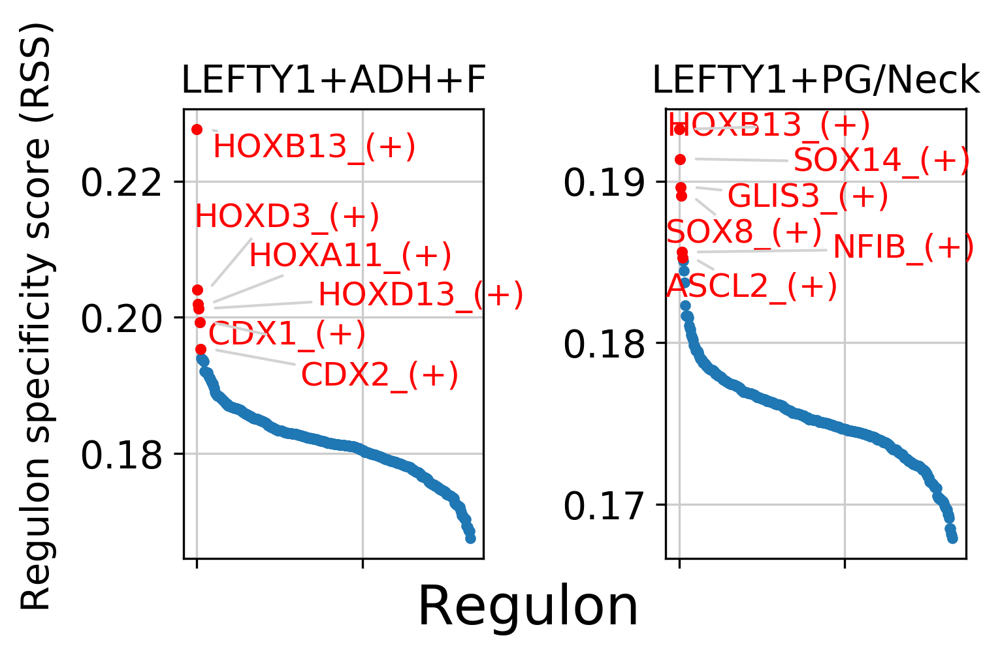

In [335]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_cellType, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

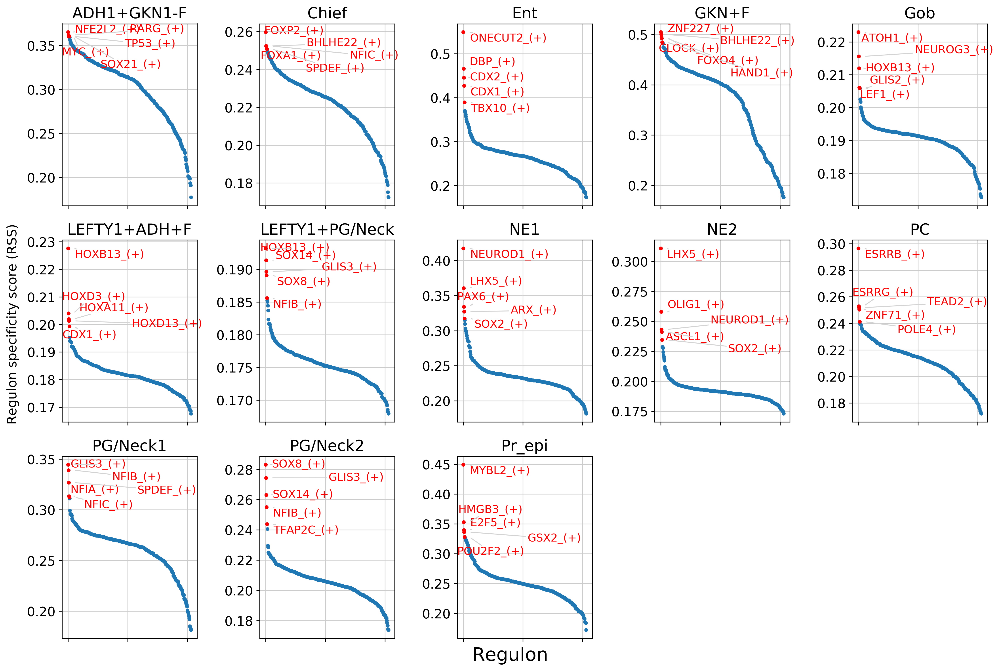

In [336]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [337]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(20).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

,ADH1+GKN1-F,Chief,Ent,GKN+F,Gob,LEFTY1+ADH+F,LEFTY1+PG/Neck,NE1,NE2,PC,PG/Neck1,PG/Neck2,Pr_epi
0,NFE2L2_(+),FOXP2_(+),ONECUT2_(+),ZNF227_(+),ATOH1_(+),HOXB13_(+),HOXB13_(+),NEUROD1_(+),LHX5_(+),ESRRB_(+),GLIS3_(+),SOX8_(+),MYBL2_(+)
1,RARG_(+),BHLHE22_(+),DBP_(+),BHLHE22_(+),NEUROG3_(+),HOXD3_(+),SOX14_(+),LHX5_(+),OLIG1_(+),ESRRG_(+),NFIB_(+),GLIS3_(+),HMGB3_(+)
2,MYC_(+),NFIC_(+),CDX2_(+),CLOCK_(+),HOXB13_(+),HOXA11_(+),GLIS3_(+),PAX6_(+),NEUROD1_(+),TEAD2_(+),SPDEF_(+),SOX14_(+),E2F5_(+)
3,TP53_(+),FOXA1_(+),CDX1_(+),FOXO4_(+),LEF1_(+),HOXD13_(+),SOX8_(+),ARX_(+),ASCL1_(+),ZNF71_(+),NFIA_(+),NFIB_(+),GSX2_(+)
4,SOX21_(+),SPDEF_(+),TBX10_(+),HAND1_(+),GLIS2_(+),CDX1_(+),NFIB_(+),SOX2_(+),SOX2_(+),POLE4_(+),NFIC_(+),TFAP2C_(+),POU2F2_(+)
5,BHLHE40_(+),POU6F1_(+),TBX3_(+),FOXA3_(+),SOX12_(+),CDX2_(+),ASCL2_(+),NR0B1_(+),NKX6-1_(+),FOXA1_(+),FOXA1_(+),SPDEF_(+),BORCS8-MEF2B_(+)
6,FOXQ1_(+),FOXO4_(+),NR1I2_(+),HOXB2_(+),CDX1_(+),MYC_(+),RXRG_(+),NEUROD2_(+),LMX1B_(+),TFAP2C_(+),SOX8_(+),ASCL2_(+),FLI1_(+)
7,NFKB1_(+),NFIA_(+),NR5A2_(+),POU5F1_(+),HOXA10_(+),ASCL2_(+),HOXD13_(+),ASCL1_(+),NR0B1_(+),SP5_(+),FOXP1_(+),EHF_(+),BRCA1_(+)
8,TGIF1_(+),HAND1_(+),VDR_(+),RUNX3_(+),PAX4_(+),HOXA10_(+),TFDP2_(+),NEUROG3_(+),TEAD1_(+),NFE2_(+),ZFHX3_(+),ZNF471_(+),TFDP1_(+)
9,BCL3_(+),SP5_(+),HOXB13_(+),TP73_(+),HOXA11_(+),RXRG_(+),EHF_(+),DDIT3_(+),ARX_(+),BHLHE22_(+),GATA6_(+),ELF5_(+),E2F1_(+)


In [338]:
top20.to_csv('./scenic_100times/top20_4.csv')

In [339]:
# scenic output
lf = lp.connect( './scenic_100times/pyscenic_100x_3_5.loom', mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )

In [340]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

In [341]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": 1,
        "name": "monocle3 umap"
    },
    {
        "id": 2,
        "name": "SCENIC AUC UMAP"
    },
]


# SCENIC regulon thresholds:


In [342]:
metaJson["regulonThresholds"] = rt

In [343]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [344]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
  #  "nUMI": np.array(adata.obs['n_counts'].values),
   # "nGene": np.array(adata.obs['n_genes'].values),
    #"Louvain_clusters_Scanpy": np.array( adata.obs['louvain'].values ),
    #"Genotype": np.array(adata.obs['Genotype'].values),
    #"Timepoint": np.array(adata.obs['Timepoint'].values),
    #"Sample": np.array(adata.obs['Sample'].values),
 #   "Percent_mito": np.array(adata.obs['percent_mito'].values),
 #   "Embedding": dfToNamedMatrix(tsneDF),
#    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
 #   "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
 #   "Clusterings": dfToNamedMatrix(clusterings),
  #  "ClusterID": np.array(adata.obs['louvain'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

In [345]:
lp.create(
    filename = './scenic_100times/pysceic_100x_4_5.loom' ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

In [346]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE
import json
import base64
import zlib
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
import matplotlib as mpl
import matplotlib.pyplot as plt
#from scanpy.plotting._tools.scatterplots import plot_scatter
import seaborn as sns

In [347]:
f_final_loom = './scenic_100times/pysceic_100x_4_5.loom'

In [348]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [349]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [350]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [351]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

In [352]:
lf.close()


In [353]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('./scenic_100times/reg_5.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [354]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [355]:
df_motifs = load_motifs('./scenic_100times/reg_5.csv')

#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [356]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.rcParams.update({'font.size':12})

fig, ax2 = plt.subplots(figsize=(17,10), dpi=150 )

#drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax2, palette=colors,s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

#plt.tight_layout()
#plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [357]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [358]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [359]:
# 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
rss_cellType

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF568_(+),ZNF597_(+),ZNF607_(+),ZNF66_(+),ZNF76_(+),ZNF768_(+),ZNF83_(+),ZNF835_(+),ZSCAN16_(+),ZSCAN4_(+)
Chief,0.261843,0.194334,0.234767,0.240067,0.232274,0.236200,0.235580,0.233361,0.218837,0.219660,...,0.237554,0.233709,0.192144,0.235785,0.233020,0.226191,0.204249,0.197377,0.232525,0.182358
PG/Neck1,0.291414,0.226813,0.282776,0.269687,0.269468,0.265465,0.266383,0.276592,0.265766,0.266941,...,0.256836,0.274544,0.214551,0.287098,0.273624,0.275040,0.249660,0.221280,0.257657,0.206846
GKN+F,0.466037,0.377162,0.428016,0.431548,0.390970,0.413874,0.464293,0.349006,0.417235,0.407598,...,0.448722,0.414427,0.190196,0.415936,0.431878,0.400014,0.334199,0.233924,0.425866,0.352481
PG/Neck2,0.197849,0.193651,0.207250,0.196270,0.204966,0.206179,0.194010,0.216438,0.214240,0.214796,...,0.185940,0.206445,0.206213,0.207860,0.203536,0.204863,0.201149,0.192274,0.194697,0.188593
PC,0.237678,0.188059,0.221985,0.224868,0.222077,0.219524,0.223592,0.229512,0.206054,0.206694,...,0.223550,0.217966,0.181843,0.221287,0.220293,0.212036,0.189539,0.186218,0.218674,0.187032
Pr_epi,0.228191,0.221823,0.248348,0.240358,0.258050,0.223424,0.248218,0.252342,0.253786,0.257620,...,0.230544,0.256790,0.185100,0.262183,0.262146,0.266354,0.232404,0.205825,0.255986,0.202048
ADH1+GKN1-F,0.250077,0.271923,0.317528,0.263348,0.286454,0.245401,0.282835,0.318918,0.348636,0.348338,...,0.249949,0.319559,0.210333,0.321522,0.314439,0.331215,0.311782,0.242171,0.273107,0.280914
NE2,0.188845,0.188914,0.192612,0.197676,0.220989,0.242946,0.186403,0.199792,0.188514,0.190307,...,0.195183,0.193020,0.205414,0.193955,0.194108,0.194178,0.191147,0.185174,0.189602,0.182330
NE1,0.212295,0.250843,0.230865,0.246628,0.323445,0.331676,0.214645,0.258908,0.228237,0.234309,...,0.250059,0.238502,0.230616,0.239852,0.241211,0.240895,0.230392,0.203874,0.227657,0.203610
LEFTY1+ADH+F,0.169919,0.174660,0.178950,0.174202,0.180590,0.172915,0.173569,0.186110,0.187168,0.187359,...,0.171406,0.181257,0.179309,0.179899,0.179662,0.182663,0.183139,0.176918,0.177750,0.175268


In [360]:
from adjustText import adjust_text

from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

cell_types = list(adata.obs['subcluster'].unique())
n_types = len(cell_types)
regulons = list(auc_mtx.columns)
n_regulons = len(regulons)
rss_values = np.empty(shape=(n_types, n_regulons), dtype=np.float)

from scipy.spatial.distance import jensenshannon
from math import sqrt


In [361]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [362]:
from adjustText import adjust_text


In [363]:
rss_cellType.index

Index(['Chief', 'PG/Neck1', 'GKN+F', 'PG/Neck2', 'PC', 'Pr_epi', 'ADH1+GKN1-F',
       'NE2', 'NE1', 'LEFTY1+ADH+F', 'Ent', 'Gob', 'LEFTY1+PG/Neck'],
      dtype='object')

In [364]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

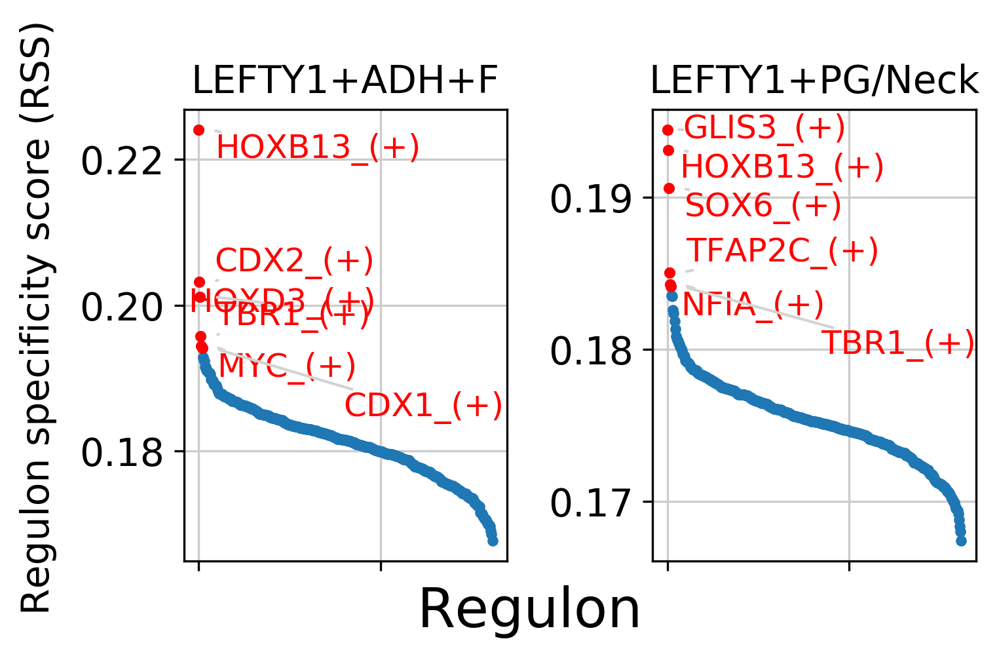

In [365]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_cellType, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

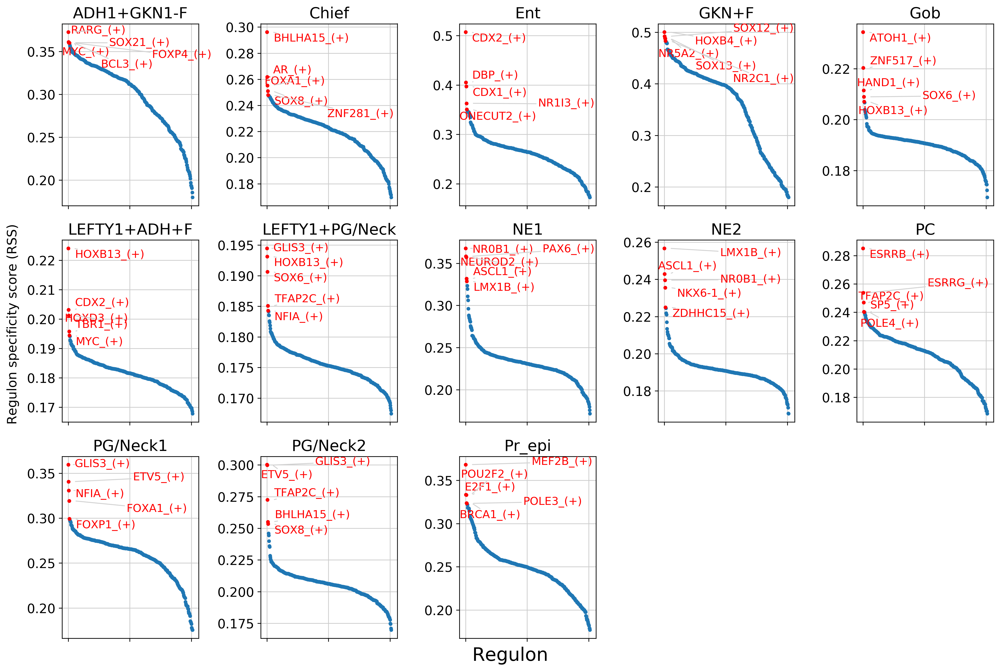

In [366]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [367]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(20).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

,ADH1+GKN1-F,Chief,Ent,GKN+F,Gob,LEFTY1+ADH+F,LEFTY1+PG/Neck,NE1,NE2,PC,PG/Neck1,PG/Neck2,Pr_epi
0,RARG_(+),BHLHA15_(+),CDX2_(+),HOXB4_(+),ATOH1_(+),HOXB13_(+),GLIS3_(+),NR0B1_(+),LMX1B_(+),ESRRB_(+),GLIS3_(+),ETV5_(+),MEF2B_(+)
1,MYC_(+),AR_(+),DBP_(+),SOX12_(+),ZNF517_(+),CDX2_(+),HOXB13_(+),PAX6_(+),ASCL1_(+),ESRRG_(+),ETV5_(+),GLIS3_(+),POU2F2_(+)
2,SOX21_(+),FOXA1_(+),CDX1_(+),NR5A2_(+),HAND1_(+),HOXD3_(+),SOX6_(+),NEUROD2_(+),NR0B1_(+),TFAP2C_(+),NFIA_(+),TFAP2C_(+),E2F1_(+)
3,BCL3_(+),SOX8_(+),NR1I3_(+),SOX13_(+),SOX6_(+),TBR1_(+),TFAP2C_(+),ASCL1_(+),NKX6-1_(+),POLE4_(+),FOXA1_(+),BHLHA15_(+),BRCA1_(+)
4,FOXP4_(+),ZNF281_(+),ONECUT2_(+),NR2C1_(+),HOXB13_(+),MYC_(+),NFIA_(+),LMX1B_(+),ZDHHC15_(+),SP5_(+),FOXP1_(+),SOX8_(+),POLE3_(+)
5,TGIF1_(+),SETDB1_(+),NR1H4_(+),RORA_(+),TFAP2A_(+),CDX1_(+),TBR1_(+),ARX_(+),TEAD1_(+),NFE2_(+),SP5_(+),TRPS1_(+),TFDP1_(+)
6,NFE2L2_(+),NFE2_(+),PRDM1_(+),ZNF281_(+),NEUROD2_(+),DLX2_(+),LHX4_(+),FOXB1_(+),NEUROD2_(+),SOX14_(+),FOXN3_(+),NFIA_(+),FLI1_(+)
7,HMGA1_(+),FOXN3_(+),HOXB13_(+),INSM2_(+),CDX1_(+),TFAP2A_(+),SOX14_(+),PBX3_(+),ARX_(+),ZNF467_(+),CDX4_(+),SOX6_(+),E2F7_(+)
8,NFKB1_(+),SP5_(+),MAF_(+),NFE2_(+),CDX2_(+),TGIF1_(+),SOX8_(+),NKX6-1_(+),PAX6_(+),AR_(+),KLF9_(+),RUNX1_(+),E2F5_(+)
9,MAFF_(+),NR2F1_(+),ESRRA_(+),FOXA3_(+),HOXC11_(+),HDAC2_(+),ETV5_(+),TEAD1_(+),PTF1A_(+),BHLHE22_(+),CREBZF_(+),CDX4_(+),MYBL1_(+)


In [368]:
top20.to_csv('./scenic_100times/top20_5.csv')

In [390]:
f_final_loom = './scenic_100times/pysceic_100x_4_1.loom'

In [391]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [392]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [393]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [394]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

In [395]:
lf.close()


In [396]:
# load the regulons from a file using the load_signatures function
sig = load_signatures('./scenic_100times/reg_1.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [398]:
df_motifs = load_motifs('./scenic_100times/reg_1.csv')

#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

In [399]:
def colorMap( x, palette='bright' ):
    import natsort
    from collections import OrderedDict
    #
    n=len(set(x))
    cpalette = sns.color_palette(palette,n_colors=n )
    cdict = dict( zip( list(set(x)), cpalette ))
    cmap = [ cdict[i] for i in x ]
    cdict = OrderedDict( natsort.natsorted(cdict.items()) )
    return cmap,cdict

def drplot( dr, colorlab, ax, palette='bright', title=None, **kwargs ):
    cmap,cdict = colorMap( colorlab, palette )
    for lab,col in cdict.items():  
        ix = colorlab.loc[colorlab==lab].index
        ax.scatter( dr['X'][ix], dr['Y'][ix], c=[col]*len(ix), alpha=0.7, label=lab, edgecolors='none')
    if( title is not None ):
        ax.set_title(title, fontsize='x-large');
    #
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.rcParams.update({'font.size':12})

fig, ax2 = plt.subplots(figsize=(17,10), dpi=150 )

#drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax1, palette='bright', s=2, title='Highly variable genes - UMAP' )

drplot( dr_tsne, colorlab=adata.obs['subcluster'], ax=ax2, palette=colors,s=2, title='SCENIC AUC - UMAP' )
ax2.legend(loc='right', bbox_to_anchor=(1.15, 0.5), ncol=1, markerscale=2, fontsize='x-large', frameon=False, title="Louvain\nclusters")

#plt.tight_layout()
#plt.savefig("PBMC10k_dimred_umap-hvg-scenic-louvain.pdf", dpi=600, bbox_inches = "tight")

In [401]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [402]:
# 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
rss_cellType

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARNTL2_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF607_(+),ZNF623_(+),ZNF768_(+),ZNF778_(+),ZNF835_(+),ZNF91_(+),ZSCAN16_(+),ZSCAN21_(+),ZSCAN31_(+),ZSCAN9_(+)
Chief,0.249707,0.228037,0.241780,0.187057,0.229456,0.227497,0.230484,0.238837,0.219954,0.210159,...,0.213556,0.207242,0.229093,0.209196,0.195322,0.233255,0.233736,0.193363,0.186448,0.183863
PG/Neck1,0.300614,0.262290,0.263049,0.203925,0.268278,0.257525,0.276721,0.280112,0.266216,0.248859,...,0.270571,0.260047,0.277518,0.252238,0.217513,0.266715,0.266544,0.212587,0.201932,0.196624
GKN+F,0.327357,0.462895,0.463330,0.211854,0.400684,0.374406,0.400256,0.380583,0.419417,0.450360,...,0.300791,0.292312,0.415367,0.308488,0.229634,0.403813,0.432246,0.184130,0.254322,0.194216
PG/Neck2,0.220678,0.196986,0.193745,0.188370,0.198078,0.203519,0.211575,0.208566,0.214193,0.206951,...,0.215544,0.213172,0.206990,0.200260,0.191996,0.200176,0.197304,0.188205,0.183736,0.190651
PC,0.230960,0.217686,0.231831,0.179330,0.225768,0.212514,0.216277,0.226775,0.206506,0.198288,...,0.203870,0.204964,0.215240,0.198576,0.185318,0.217801,0.220497,0.179136,0.228197,0.175269
Pr_epi,0.219310,0.247320,0.240589,0.206519,0.290677,0.217778,0.271275,0.255483,0.254453,0.250090,...,0.247166,0.255062,0.261421,0.208355,0.204438,0.246769,0.263342,0.189605,0.190909,0.198487
ADH1+GKN1-F,0.281790,0.285593,0.265242,0.218789,0.324667,0.242502,0.330840,0.313259,0.346468,0.352078,...,0.312192,0.302398,0.329214,0.288481,0.239380,0.282232,0.291866,0.200566,0.240280,0.220987
NE2,0.184778,0.193633,0.188728,0.207457,0.188798,0.251575,0.196757,0.196655,0.188719,0.183863,...,0.196212,0.191214,0.191851,0.184723,0.185025,0.194832,0.189606,0.179325,0.184618,0.179810
NE1,0.200625,0.256490,0.220033,0.291850,0.225747,0.334970,0.248298,0.248175,0.228454,0.214423,...,0.258024,0.228474,0.235634,0.208617,0.201249,0.233857,0.229526,0.194960,0.210597,0.190840
LEFTY1+ADH+F,0.179144,0.175886,0.174698,0.176216,0.181284,0.174854,0.182469,0.184724,0.187146,0.185149,...,0.183981,0.181812,0.181904,0.176835,0.177236,0.176489,0.178285,0.171620,0.171728,0.182774


In [404]:
cell_types

['Chief',
 'PG/Neck1',
 'GKN+F',
 'PG/Neck2',
 'PC',
 'Pr_epi',
 'ADH1+GKN1-F',
 'NE2',
 'NE1',
 'LEFTY1+ADH+F',
 'Ent',
 'Gob',
 'LEFTY1+PG/Neck']

In [405]:
from adjustText import adjust_text


In [406]:
rss_cellType.index

Index(['Chief', 'PG/Neck1', 'GKN+F', 'PG/Neck2', 'PC', 'Pr_epi', 'ADH1+GKN1-F',
       'NE2', 'NE1', 'LEFTY1+ADH+F', 'Ent', 'Gob', 'LEFTY1+PG/Neck'],
      dtype='object')

In [407]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

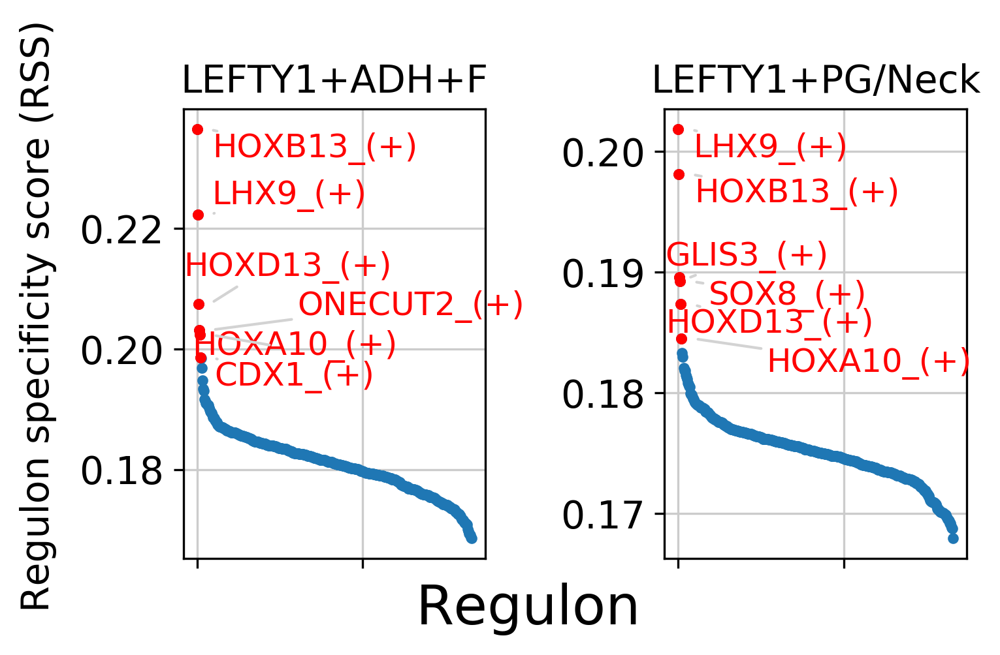

In [408]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_cellType, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

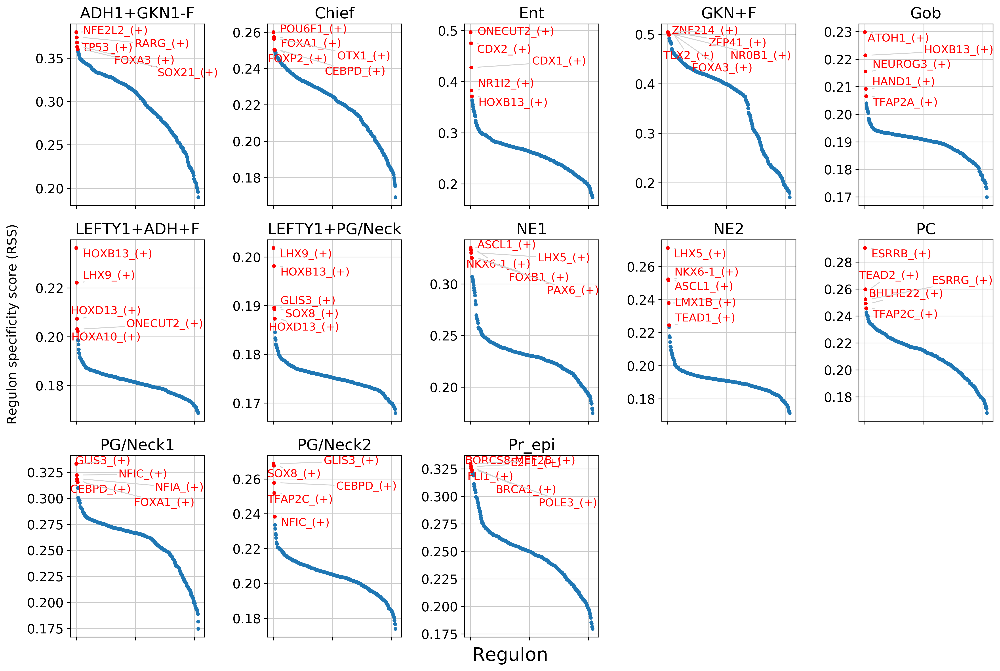

In [409]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [449]:
rss_cellType

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARNTL2_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF607_(+),ZNF623_(+),ZNF768_(+),ZNF778_(+),ZNF835_(+),ZNF91_(+),ZSCAN16_(+),ZSCAN21_(+),ZSCAN31_(+),ZSCAN9_(+)
Chief,0.249707,0.228037,0.241780,0.187057,0.229456,0.227497,0.230484,0.238837,0.219954,0.210159,...,0.213556,0.207242,0.229093,0.209196,0.195322,0.233255,0.233736,0.193363,0.186448,0.183863
PG/Neck1,0.300614,0.262290,0.263049,0.203925,0.268278,0.257525,0.276721,0.280112,0.266216,0.248859,...,0.270571,0.260047,0.277518,0.252238,0.217513,0.266715,0.266544,0.212587,0.201932,0.196624
GKN+F,0.327357,0.462895,0.463330,0.211854,0.400684,0.374406,0.400256,0.380583,0.419417,0.450360,...,0.300791,0.292312,0.415367,0.308488,0.229634,0.403813,0.432246,0.184130,0.254322,0.194216
PG/Neck2,0.220678,0.196986,0.193745,0.188370,0.198078,0.203519,0.211575,0.208566,0.214193,0.206951,...,0.215544,0.213172,0.206990,0.200260,0.191996,0.200176,0.197304,0.188205,0.183736,0.190651
PC,0.230960,0.217686,0.231831,0.179330,0.225768,0.212514,0.216277,0.226775,0.206506,0.198288,...,0.203870,0.204964,0.215240,0.198576,0.185318,0.217801,0.220497,0.179136,0.228197,0.175269
Pr_epi,0.219310,0.247320,0.240589,0.206519,0.290677,0.217778,0.271275,0.255483,0.254453,0.250090,...,0.247166,0.255062,0.261421,0.208355,0.204438,0.246769,0.263342,0.189605,0.190909,0.198487
ADH1+GKN1-F,0.281790,0.285593,0.265242,0.218789,0.324667,0.242502,0.330840,0.313259,0.346468,0.352078,...,0.312192,0.302398,0.329214,0.288481,0.239380,0.282232,0.291866,0.200566,0.240280,0.220987
NE2,0.184778,0.193633,0.188728,0.207457,0.188798,0.251575,0.196757,0.196655,0.188719,0.183863,...,0.196212,0.191214,0.191851,0.184723,0.185025,0.194832,0.189606,0.179325,0.184618,0.179810
NE1,0.200625,0.256490,0.220033,0.291850,0.225747,0.334970,0.248298,0.248175,0.228454,0.214423,...,0.258024,0.228474,0.235634,0.208617,0.201249,0.233857,0.229526,0.194960,0.210597,0.190840
LEFTY1+ADH+F,0.179144,0.175886,0.174698,0.176216,0.181284,0.174854,0.182469,0.184724,0.187146,0.185149,...,0.183981,0.181812,0.181904,0.176835,0.177236,0.176489,0.178285,0.171620,0.171728,0.182774


In [410]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_cellType.iloc[i,:]).sort_values(pd.DataFrame(rss_cellType).index[i],ascending=False).head(20).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

,ADH1+GKN1-F,Chief,Ent,GKN+F,Gob,LEFTY1+ADH+F,LEFTY1+PG/Neck,NE1,NE2,PC,PG/Neck1,PG/Neck2,Pr_epi
0,NFE2L2_(+),POU6F1_(+),ONECUT2_(+),ZFP41_(+),ATOH1_(+),HOXB13_(+),LHX9_(+),ASCL1_(+),LHX5_(+),ESRRB_(+),GLIS3_(+),GLIS3_(+),BORCS8-MEF2B_(+)
1,RARG_(+),FOXA1_(+),CDX2_(+),ZNF214_(+),HOXB13_(+),LHX9_(+),HOXB13_(+),NKX6-1_(+),NKX6-1_(+),TEAD2_(+),NFIC_(+),SOX8_(+),E2F1_(+)
2,TP53_(+),OTX1_(+),CDX1_(+),TLX2_(+),NEUROG3_(+),HOXD13_(+),GLIS3_(+),LHX5_(+),ASCL1_(+),ESRRG_(+),NFIA_(+),CEBPD_(+),FLI1_(+)
3,FOXA3_(+),FOXP2_(+),NR1I2_(+),NR0B1_(+),HAND1_(+),ONECUT2_(+),SOX8_(+),FOXB1_(+),LMX1B_(+),BHLHE22_(+),CEBPD_(+),TFAP2C_(+),BRCA1_(+)
4,SOX21_(+),CEBPD_(+),HOXB13_(+),FOXA3_(+),TFAP2A_(+),HOXA10_(+),HOXD13_(+),PAX6_(+),TEAD1_(+),TFAP2C_(+),FOXA1_(+),NFIC_(+),POLE3_(+)
5,CEBPD_(+),AR_(+),HOXA13_(+),MAFA_(+),HOXA10_(+),CDX1_(+),HOXA10_(+),NEUROD2_(+),PBX1_(+),ATF6_(+),KLF9_(+),NFIA_(+),POU2F2_(+)
6,MYC_(+),ZFP41_(+),NR1I3_(+),HOXA11_(+),CDX1_(+),CDX2_(+),LHX4_(+),ZNF568_(+),NEUROG3_(+),GATA5_(+),AR_(+),BCL6_(+),TFDP1_(+)
7,BCL3_(+),NFIC_(+),MAF_(+),TBX19_(+),NEUROD2_(+),NR5A2_(+),CEBPD_(+),RFX3_(+),RFX3_(+),POLE4_(+),POU6F1_(+),CREB3_(+),E2F7_(+)
8,BHLHE40_(+),NFIA_(+),NR1H4_(+),GSX2_(+),HOXC11_(+),ETV4_(+),NFIA_(+),LMX1B_(+),SOX12_(+),PAX8_(+),OTX1_(+),RARB_(+),PAX5_(+)
9,NFKB1_(+),TFAP2C_(+),HOXA9_(+),TFE3_(+),ONECUT2_(+),MYC_(+),ETV4_(+),PBX1_(+),PTF1A_(+),UBP1_(+),KLF15_(+),KLF9_(+),E2F2_(+)


In [412]:
top20.to_csv('./scenic_100times/top20_1.csv')

'MAFK_(+)'

In [456]:
def calc_rss_celltype(it): 
    adata = sc.read_loom('./pyscenic_100x_1.loom')
    f_final_loom = './scenic_100times/pysceic_100x_4_'+str(it)+'.loom'

    # scenic output
    lf = lp.connect( f_final_loom, mode='r', validate=False )
    meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
    exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
    auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

    # create a dictionary of regulons:
    regulons = {}
    for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
        regulons[i] =  list(r[r==1].index.values)

    lf.ca.keys()

    lf.close()


    # load the regulons from a file using the load_signatures function
    sig = load_signatures('./scenic_100times/reg_'+str(it)+'.csv')
    adata = add_scenic_metadata(adata, auc_mtx, sig)

    # 各regulonごとに各細胞種のRSS (1-jensenshannon距離)を計算
    rss_cellType = regulon_specificity_scores( auc_mtx,adata.obs['subcluster'])
    return(rss_cellType)

In [457]:
rss1 = calc_rss_celltype(it=1)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [458]:
rss1

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARNTL2_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF607_(+),ZNF623_(+),ZNF768_(+),ZNF778_(+),ZNF835_(+),ZNF91_(+),ZSCAN16_(+),ZSCAN21_(+),ZSCAN31_(+),ZSCAN9_(+)
Chief,0.249707,0.228037,0.241780,0.187057,0.229456,0.227497,0.230484,0.238837,0.219954,0.210159,...,0.213556,0.207242,0.229093,0.209196,0.195322,0.233255,0.233736,0.193363,0.186448,0.183863
PG/Neck1,0.300614,0.262290,0.263049,0.203925,0.268278,0.257525,0.276721,0.280112,0.266216,0.248859,...,0.270571,0.260047,0.277518,0.252238,0.217513,0.266715,0.266544,0.212587,0.201932,0.196624
GKN+F,0.327357,0.462895,0.463330,0.211854,0.400684,0.374406,0.400256,0.380583,0.419417,0.450360,...,0.300791,0.292312,0.415367,0.308488,0.229634,0.403813,0.432246,0.184130,0.254322,0.194216
PG/Neck2,0.220678,0.196986,0.193745,0.188370,0.198078,0.203519,0.211575,0.208566,0.214193,0.206951,...,0.215544,0.213172,0.206990,0.200260,0.191996,0.200176,0.197304,0.188205,0.183736,0.190651
PC,0.230960,0.217686,0.231831,0.179330,0.225768,0.212514,0.216277,0.226775,0.206506,0.198288,...,0.203870,0.204964,0.215240,0.198576,0.185318,0.217801,0.220497,0.179136,0.228197,0.175269
Pr_epi,0.219310,0.247320,0.240589,0.206519,0.290677,0.217778,0.271275,0.255483,0.254453,0.250090,...,0.247166,0.255062,0.261421,0.208355,0.204438,0.246769,0.263342,0.189605,0.190909,0.198487
ADH1+GKN1-F,0.281790,0.285593,0.265242,0.218789,0.324667,0.242502,0.330840,0.313259,0.346468,0.352078,...,0.312192,0.302398,0.329214,0.288481,0.239380,0.282232,0.291866,0.200566,0.240280,0.220987
NE2,0.184778,0.193633,0.188728,0.207457,0.188798,0.251575,0.196757,0.196655,0.188719,0.183863,...,0.196212,0.191214,0.191851,0.184723,0.185025,0.194832,0.189606,0.179325,0.184618,0.179810
NE1,0.200625,0.256490,0.220033,0.291850,0.225747,0.334970,0.248298,0.248175,0.228454,0.214423,...,0.258024,0.228474,0.235634,0.208617,0.201249,0.233857,0.229526,0.194960,0.210597,0.190840
LEFTY1+ADH+F,0.179144,0.175886,0.174698,0.176216,0.181284,0.174854,0.182469,0.184724,0.187146,0.185149,...,0.183981,0.181812,0.181904,0.176835,0.177236,0.176489,0.178285,0.171620,0.171728,0.182774


In [459]:
rss2 = calc_rss_celltype(it=2)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [460]:
rss2

,ARID3A_(+),ARID5B_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF76_(+),ZNF768_(+),ZNF787_(+),ZNF8_(+),ZNF823_(+),ZNF835_(+),ZSCAN16_(+),ZSCAN31_(+),ZSCAN4_(+),ZSCAN9_(+)
Chief,0.223672,0.224882,0.229457,0.192788,0.236830,0.228889,0.234140,0.215229,0.220179,0.205803,...,0.228134,0.225227,0.221297,0.229746,0.197154,0.244601,0.225265,0.186937,0.186221,0.243921
PG/Neck1,0.260415,0.275933,0.276545,0.217620,0.265145,0.260438,0.277870,0.251933,0.266257,0.251543,...,0.276797,0.276249,0.263023,0.274606,0.229495,0.268320,0.251525,0.202423,0.197939,0.246934
GKN+F,0.457619,0.405458,0.382456,0.233371,0.420835,0.373805,0.391047,0.253951,0.419555,0.412713,...,0.389571,0.403832,0.446821,0.404470,0.296862,0.499892,0.406413,0.253790,0.347972,0.436385
PG/Neck2,0.198784,0.221066,0.211695,0.190647,0.196181,0.209606,0.211305,0.208413,0.213826,0.214565,...,0.208157,0.209877,0.200109,0.205960,0.200945,0.186725,0.194497,0.183644,0.179495,0.183848
PC,0.216086,0.204727,0.210746,0.181528,0.222519,0.213388,0.221509,0.230746,0.206569,0.194689,...,0.213729,0.211230,0.214760,0.213186,0.190719,0.231998,0.217165,0.226385,0.191738,0.227896
Pr_epi,0.247363,0.258263,0.240798,0.214119,0.231257,0.226674,0.271830,0.246221,0.254247,0.247736,...,0.265747,0.258587,0.236683,0.256287,0.243626,0.235800,0.262262,0.191149,0.194805,0.224749
ADH1+GKN1-F,0.290707,0.347466,0.311184,0.239608,0.251912,0.259943,0.326074,0.288730,0.346573,0.358829,...,0.334095,0.336157,0.315757,0.321880,0.295189,0.253666,0.289980,0.239425,0.252199,0.225714
NE2,0.198742,0.190945,0.195007,0.204141,0.222577,0.256872,0.194559,0.195941,0.188806,0.184583,...,0.194883,0.192542,0.186804,0.193154,0.192868,0.189295,0.190160,0.185425,0.177971,0.186119
NE1,0.263206,0.232819,0.237317,0.285196,0.337782,0.336819,0.243178,0.251012,0.228888,0.219830,...,0.244361,0.237312,0.215845,0.234579,0.217925,0.220361,0.226772,0.218673,0.185829,0.210136
LEFTY1+ADH+F,0.176406,0.187447,0.179858,0.176684,0.172895,0.178631,0.182698,0.183143,0.186872,0.189635,...,0.183453,0.182862,0.179085,0.180366,0.180182,0.169990,0.181751,0.171459,0.171770,0.174211


In [461]:
rss3 = calc_rss_celltype(it=3)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [462]:
rss3

,AEBP2_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF669_(+),ZNF675_(+),ZNF740_(+),ZNF76_(+),ZNF778_(+),ZNF823_(+),ZNF83_(+),ZNF835_(+),ZNF845_(+),ZSCAN16_(+)
Chief,0.227171,0.220374,0.228122,0.193776,0.235081,0.232908,0.241293,0.229364,0.220375,0.220330,...,0.217644,0.178341,0.237166,0.226114,0.208796,0.185640,0.229747,0.230955,0.241323,0.203665
PG/Neck1,0.242047,0.255819,0.270783,0.219895,0.261142,0.264272,0.274115,0.285150,0.266696,0.266847,...,0.264674,0.183350,0.253117,0.270926,0.248313,0.212046,0.268311,0.241216,0.257170,0.241202
GKN+F,0.391062,0.423157,0.395351,0.235171,0.411653,0.411124,0.452374,0.312936,0.420529,0.413665,...,0.336783,0.173964,0.360743,0.377132,0.296961,0.208944,0.450412,0.365286,0.479484,0.295150
PG/Neck2,0.188070,0.202530,0.205470,0.192061,0.200103,0.204239,0.198442,0.215971,0.213961,0.214095,...,0.209981,0.177633,0.197013,0.205900,0.198904,0.200275,0.201428,0.186625,0.184423,0.205163
PC,0.215830,0.208124,0.216708,0.182287,0.217229,0.220182,0.229276,0.216330,0.207009,0.207753,...,0.195463,0.175723,0.226413,0.213998,0.196644,0.187873,0.216567,0.216512,0.227911,0.198619
Pr_epi,0.243636,0.243488,0.246442,0.216334,0.226881,0.232100,0.259641,0.258098,0.254567,0.256351,...,0.246292,0.204208,0.258716,0.262616,0.201914,0.224662,0.244471,0.217167,0.231462,0.267729
ADH1+GKN1-F,0.255714,0.293205,0.314786,0.242861,0.249296,0.261592,0.295408,0.328285,0.345897,0.346940,...,0.320583,0.183081,0.243273,0.325439,0.269512,0.223324,0.298369,0.236489,0.241916,0.317709
NE2,0.185267,0.193199,0.197337,0.196391,0.223343,0.246121,0.193263,0.202540,0.188828,0.189218,...,0.196109,0.177915,0.186713,0.195434,0.185816,0.184839,0.188886,0.185897,0.188766,0.188843
NE1,0.217823,0.243883,0.243566,0.252535,0.355427,0.322142,0.234944,0.248456,0.228537,0.231217,...,0.249289,0.184356,0.212319,0.252367,0.210294,0.192129,0.225940,0.204791,0.214969,0.225869
LEFTY1+ADH+F,0.177167,0.178445,0.179712,0.177294,0.171444,0.176275,0.176744,0.184471,0.186760,0.186997,...,0.181984,0.172302,0.177737,0.183601,0.176988,0.172786,0.179752,0.174283,0.170455,0.187877


In [463]:
rss4 = calc_rss_celltype(it=4)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [464]:
rss4

,AEBP2_(+),AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ASCL2_(+),ATF1_(+),ATF2_(+),...,ZNF577_(+),ZNF607_(+),ZNF697_(+),ZNF71_(+),ZNF761_(+),ZNF799_(+),ZNF83_(+),ZNF835_(+),ZNF841_(+),ZSCAN16_(+)
Chief,0.187811,0.193957,0.232703,0.232051,0.191315,0.225966,0.235113,0.226457,0.190001,0.221121,...,0.226402,0.201002,0.238282,0.238959,0.227187,0.229749,0.234063,0.243471,0.241500,0.231793
PG/Neck1,0.211716,0.206095,0.263313,0.273637,0.216912,0.267169,0.267736,0.294364,0.210796,0.264248,...,0.279747,0.230881,0.273732,0.271647,0.265847,0.273618,0.268215,0.249879,0.279687,0.250962
GKN+F,0.244288,0.203252,0.473633,0.412133,0.227784,0.348878,0.411657,0.288341,0.245629,0.279409,...,0.299252,0.237943,0.450842,0.425035,0.434808,0.388161,0.462997,0.435122,0.447439,0.386771
PG/Neck2,0.191250,0.193362,0.196960,0.206983,0.188738,0.208644,0.208158,0.240655,0.200220,0.213704,...,0.215702,0.211464,0.203689,0.202193,0.200280,0.215729,0.196956,0.183501,0.199902,0.197438
PC,0.185599,0.183782,0.222786,0.219634,0.182853,0.220278,0.219877,0.209117,0.190454,0.227249,...,0.210459,0.187197,0.232198,0.250399,0.210650,0.228494,0.220888,0.228054,0.224498,0.220688
Pr_epi,0.237284,0.190985,0.245124,0.250462,0.203787,0.267635,0.232611,0.267387,0.242193,0.246502,...,0.246336,0.201163,0.229430,0.243190,0.248392,0.239502,0.240794,0.222189,0.244447,0.253246
ADH1+GKN1-F,0.269704,0.212085,0.283329,0.320144,0.232735,0.300369,0.262449,0.350518,0.251668,0.302263,...,0.319880,0.249989,0.270609,0.274844,0.308682,0.303995,0.278358,0.231697,0.286574,0.255534
NE2,0.181178,0.172893,0.194662,0.196250,0.198254,0.221793,0.241171,0.201293,0.185170,0.201205,...,0.202147,0.198703,0.191561,0.187964,0.187187,0.191357,0.190411,0.186208,0.189384,0.188369
NE1,0.206071,0.186482,0.255074,0.244569,0.253143,0.327332,0.303504,0.251741,0.217090,0.254523,...,0.261504,0.250414,0.244497,0.220580,0.227170,0.241000,0.229322,0.206325,0.230076,0.217458
LEFTY1+ADH+F,0.180915,0.176505,0.174889,0.179994,0.176663,0.184847,0.177281,0.193851,0.177326,0.183386,...,0.182334,0.180240,0.174411,0.180802,0.178704,0.181247,0.174747,0.172291,0.174708,0.177436


In [465]:
rss5 = calc_rss_celltype(it=5)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [466]:
rss5

,AR_(+),ARID3A_(+),ARNT_(+),ARNT2_(+),ARX_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),...,ZNF568_(+),ZNF597_(+),ZNF607_(+),ZNF66_(+),ZNF76_(+),ZNF768_(+),ZNF83_(+),ZNF835_(+),ZSCAN16_(+),ZSCAN4_(+)
Chief,0.261843,0.194334,0.234767,0.240067,0.232274,0.236200,0.235580,0.233361,0.218837,0.219660,...,0.237554,0.233709,0.192144,0.235785,0.233020,0.226191,0.204249,0.197377,0.232525,0.182358
PG/Neck1,0.291414,0.226813,0.282776,0.269687,0.269468,0.265465,0.266383,0.276592,0.265766,0.266941,...,0.256836,0.274544,0.214551,0.287098,0.273624,0.275040,0.249660,0.221280,0.257657,0.206846
GKN+F,0.466037,0.377162,0.428016,0.431548,0.390970,0.413874,0.464293,0.349006,0.417235,0.407598,...,0.448722,0.414427,0.190196,0.415936,0.431878,0.400014,0.334199,0.233924,0.425866,0.352481
PG/Neck2,0.197849,0.193651,0.207250,0.196270,0.204966,0.206179,0.194010,0.216438,0.214240,0.214796,...,0.185940,0.206445,0.206213,0.207860,0.203536,0.204863,0.201149,0.192274,0.194697,0.188593
PC,0.237678,0.188059,0.221985,0.224868,0.222077,0.219524,0.223592,0.229512,0.206054,0.206694,...,0.223550,0.217966,0.181843,0.221287,0.220293,0.212036,0.189539,0.186218,0.218674,0.187032
Pr_epi,0.228191,0.221823,0.248348,0.240358,0.258050,0.223424,0.248218,0.252342,0.253786,0.257620,...,0.230544,0.256790,0.185100,0.262183,0.262146,0.266354,0.232404,0.205825,0.255986,0.202048
ADH1+GKN1-F,0.250077,0.271923,0.317528,0.263348,0.286454,0.245401,0.282835,0.318918,0.348636,0.348338,...,0.249949,0.319559,0.210333,0.321522,0.314439,0.331215,0.311782,0.242171,0.273107,0.280914
NE2,0.188845,0.188914,0.192612,0.197676,0.220989,0.242946,0.186403,0.199792,0.188514,0.190307,...,0.195183,0.193020,0.205414,0.193955,0.194108,0.194178,0.191147,0.185174,0.189602,0.182330
NE1,0.212295,0.250843,0.230865,0.246628,0.323445,0.331676,0.214645,0.258908,0.228237,0.234309,...,0.250059,0.238502,0.230616,0.239852,0.241211,0.240895,0.230392,0.203874,0.227657,0.203610
LEFTY1+ADH+F,0.169919,0.174660,0.178950,0.174202,0.180590,0.172915,0.173569,0.186110,0.187168,0.187359,...,0.171406,0.181257,0.179309,0.179899,0.179662,0.182663,0.183139,0.176918,0.177750,0.175268


In [474]:
robust_tf = rss1.columns.intersection(rss2.columns).intersection(rss3.columns).intersection(rss4.columns).intersection(rss5.columns)

In [476]:
rss1_robust = rss1[robust_tf]

In [477]:
rss2_robust = rss2[robust_tf]

In [478]:
rss3_robust = rss3[robust_tf]

In [479]:
rss4_robust = rss4[robust_tf]

In [480]:
rss5_robust = rss5[robust_tf]

In [487]:
rss_mean = (rss1_robust + rss2_robust + rss3_robust + rss4_robust + rss5_robust) / 5

In [488]:
rss_mean

,ARID3A_(+),ARNT_(+),ARNT2_(+),ASCL1_(+),ATF1_(+),ATF2_(+),ATF3_(+),ATF4_(+),ATF5_(+),ATF6_(+),...,ZEB1_(+),ZFP69_(+),ZNF143_(+),ZNF227_(+),ZNF274_(+),ZNF444_(+),ZNF568_(+),ZNF607_(+),ZNF835_(+),ZSCAN16_(+)
Chief,0.219824,0.233235,0.201000,0.232121,0.226299,0.227583,0.219859,0.214798,0.230848,0.230800,...,0.232794,0.212226,0.231697,0.212897,0.232614,0.228266,0.228954,0.205346,0.222345,0.225397
PG/Neck1,0.253730,0.273358,0.225608,0.263088,0.261177,0.271607,0.266246,0.259976,0.273931,0.277837,...,0.270959,0.216953,0.269284,0.237470,0.277487,0.276954,0.260846,0.248036,0.239642,0.253578
GKN+F,0.438893,0.416257,0.267946,0.396973,0.390720,0.315177,0.419648,0.420645,0.430231,0.390462,...,0.425826,0.289334,0.421795,0.322233,0.431074,0.417236,0.361802,0.255725,0.352771,0.389289
PG/Neck2,0.197782,0.205029,0.191217,0.206340,0.203110,0.212618,0.214014,0.212992,0.206444,0.210582,...,0.203311,0.184197,0.202160,0.190723,0.204658,0.208713,0.196154,0.212154,0.188224,0.197820
PC,0.210548,0.220181,0.190173,0.217097,0.216222,0.226122,0.206520,0.201980,0.215182,0.231837,...,0.227795,0.204194,0.224279,0.205466,0.218881,0.214730,0.212739,0.194766,0.209620,0.215129
Pr_epi,0.241024,0.245328,0.216224,0.226517,0.258632,0.251729,0.254167,0.253065,0.255843,0.254531,...,0.266108,0.198034,0.273706,0.213494,0.257286,0.251835,0.224479,0.222798,0.217084,0.260513
ADH1+GKN1-F,0.284951,0.305777,0.239468,0.254377,0.297365,0.310291,0.346726,0.351242,0.323563,0.313713,...,0.294142,0.208955,0.311973,0.242050,0.319050,0.328587,0.256862,0.272989,0.240681,0.285639
NE2,0.193830,0.193987,0.200784,0.247737,0.191230,0.199226,0.188703,0.187239,0.192101,0.198832,...,0.193063,0.180613,0.193735,0.194603,0.193368,0.194826,0.201084,0.198664,0.186320,0.189316
NE1,0.253899,0.235270,0.265870,0.325822,0.231631,0.252215,0.228508,0.225734,0.234983,0.251946,...,0.233642,0.194254,0.237710,0.236706,0.239234,0.236978,0.275714,0.249473,0.207320,0.225457
LEFTY1+ADH+F,0.176057,0.178642,0.176212,0.175991,0.178561,0.184367,0.186921,0.187232,0.180819,0.181904,...,0.178592,0.174699,0.180184,0.173854,0.179941,0.181125,0.173269,0.183038,0.174144,0.180620


In [489]:
cats = rss_cellType.index
cats = sorted(list(set(adata.obs['subcluster'])))

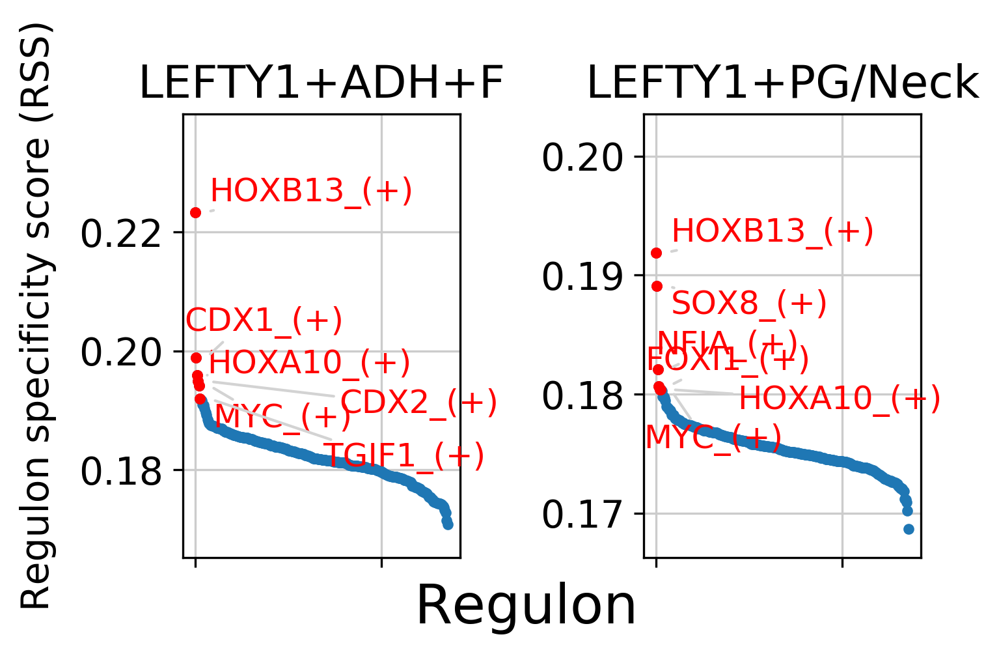

In [490]:
fig = plt.figure(figsize=(5, 3))
for c,num in zip(['LEFTY1+ADH+F','LEFTY1+PG/Neck'], range(1,len(['LEFTY1+ADH+F','LEFTY1+PG/Neck'])+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(1,2,num)
    plot_rss(rss_mean, c, top_n=6, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

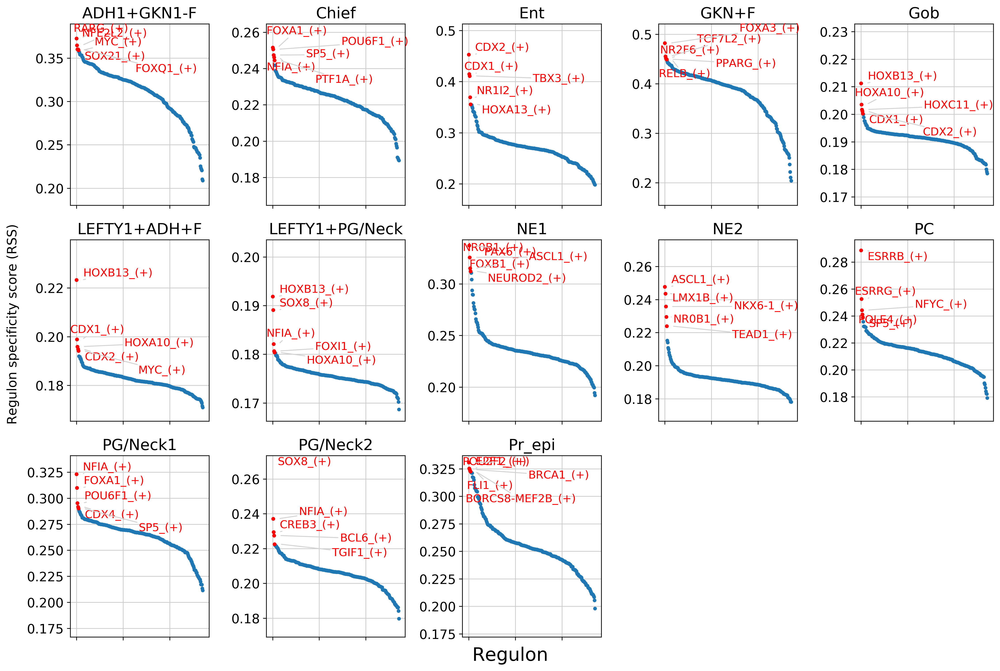

In [497]:
#cats = sorted(list(set(adata.obs['subcluster'])))

fig = plt.figure(figsize=(15, 10))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(3,5,num)
    plot_rss(rss_mean, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
#plt.savefig("PBMC10k_cellType-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [495]:
top20 = pd.DataFrame()

for i in range(len(pd.DataFrame(rss_cellType).index)):
    top20 = pd.concat([top20,pd.DataFrame(pd.DataFrame(rss_mean.iloc[i,:]).sort_values(pd.DataFrame(rss_mean).index[i],ascending=False).head(50).index)],axis=1)

top20.columns = pd.DataFrame(rss_cellType).index

top20 = top20.reindex(sorted(top20.columns), axis=1)

top20

,ADH1+GKN1-F,Chief,Ent,GKN+F,Gob,LEFTY1+ADH+F,LEFTY1+PG/Neck,NE1,NE2,PC,PG/Neck1,PG/Neck2,Pr_epi
0,RARG_(+),FOXA1_(+),CDX2_(+),FOXA3_(+),HOXB13_(+),HOXB13_(+),HOXB13_(+),PAX6_(+),ASCL1_(+),ESRRB_(+),NFIA_(+),SOX8_(+),POU2F2_(+)
1,NFE2L2_(+),POU6F1_(+),CDX1_(+),TCF7L2_(+),HOXA10_(+),CDX1_(+),SOX8_(+),NR0B1_(+),LMX1B_(+),ESRRG_(+),FOXA1_(+),NFIA_(+),E2F1_(+)
2,SOX21_(+),SP5_(+),TBX3_(+),NR2F6_(+),HOXC11_(+),HOXA10_(+),NFIA_(+),ASCL1_(+),NKX6-1_(+),NFYC_(+),POU6F1_(+),CREB3_(+),BRCA1_(+)
3,FOXQ1_(+),NFIA_(+),NR1I2_(+),PPARG_(+),CDX1_(+),CDX2_(+),FOXI1_(+),FOXB1_(+),NR0B1_(+),POLE4_(+),CDX4_(+),BCL6_(+),FLI1_(+)
4,MYC_(+),PTF1A_(+),HOXA13_(+),RELB_(+),CDX2_(+),MYC_(+),HOXA10_(+),NEUROD2_(+),TEAD1_(+),SP5_(+),SP5_(+),TGIF1_(+),BORCS8-MEF2B_(+)
5,FOXA3_(+),SOX12_(+),NR1I3_(+),IRF7_(+),PAX4_(+),TGIF1_(+),MYC_(+),LMX1B_(+),PTF1A_(+),GATA5_(+),SOX8_(+),MYC_(+),TFDP1_(+)
6,BCL3_(+),ESRRB_(+),HOXB13_(+),RXRA_(+),HOXC9_(+),ETV4_(+),TGIF1_(+),NKX6-1_(+),PAX6_(+),PTF1A_(+),CREB3_(+),ELF5_(+),E2F7_(+)
7,BHLHE40_(+),NR2F1_(+),MAF_(+),RUNX3_(+),NEUROD2_(+),HDAC2_(+),CREB3_(+),TEAD1_(+),NEUROD2_(+),FOXA1_(+),E2F8_(+),XBP1_(+),POLE3_(+)
8,TGIF1_(+),HES4_(+),NR1H4_(+),MAFG_(+),CREB3_(+),POLE4_(+),ZNF607_(+),PBX3_(+),RFX6_(+),NFE2L2_(+),HNF1B_(+),NFE2_(+),E2F2_(+)
9,NFKB1_(+),FOXP2_(+),PRDM1_(+),ZBTB7A_(+),CREB3L1_(+),HMGA1_(+),SNAI3_(+),RFX6_(+),SOX12_(+),ATF6_(+),PTF1A_(+),MAFF_(+),PAX5_(+)


In [493]:
top20.to_csv('./scenic_100times/top20_mean.csv')

In [503]:
f_final_loom = './scenic_100times/pysceic_100x_4_1.loom'

In [504]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=150)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.2 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.24.2 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [505]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [506]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).iteritems():
    regulons[i] =  list(r[r==1].index.values)

In [507]:
lf.ca.keys()

['CellID', 'RegulonsAUC']

In [508]:
lf.close()


In [526]:
mat = pd.read_csv('./UMAP_coordinates.csv')

In [514]:
adata.obs['subcluster']

Stanford_5846N1-total_AAACCTGCAATGGATA             Chief
Stanford_5846N1-total_AAAGATGGTTCCACAA          PG/Neck1
Stanford_5846N1-total_AAATGCCGTTCACCTC             GKN+F
Stanford_5846N1-total_AAATGCCTCTATCCCG          PG/Neck1
Stanford_5846N1-total_AACTCCCAGCATCATC          PG/Neck2
                                                ...     
Tsinghua_12320058M-total_TTTGTCAAGGGAAACA    ADH1+GKN1-F
Tsinghua_12320058M-total_TTTGTCACACTGTCGG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCACAGTTCCCT          GKN+F
Tsinghua_12320058M-total_TTTGTCAGTGGTAACG       PG/Neck1
Tsinghua_12320058M-total_TTTGTCAGTGTGAAAT         Pr_epi
Name: subcluster, Length: 39169, dtype: category
Categories (13, object): [ADH1+GKN1-F, Chief, Ent, GKN+F, ..., PC, PG/Neck1, PG/Neck2, Pr_epi]

In [527]:
mat.index = mat.iloc[:,0]

In [528]:
mat2 = mat.iloc[:,1:]

In [529]:
mat2

,umap_1,umap_2
Unnamed: 0,,
Stanford_5846N1-total_AAACCTGCAATGGATA,4.025505,-7.792674
Stanford_5846N1-total_AAAGATGGTTCCACAA,5.695082,-5.539867
Stanford_5846N1-total_AAATGCCGTTCACCTC,-8.936032,2.306913
Stanford_5846N1-total_AAATGCCTCTATCCCG,5.769051,-6.047552
Stanford_5846N1-total_AACTCCCAGCATCATC,5.320527,-6.008050
...,...,...
Tsinghua_12320058M-total_TTTGTCAAGGGAAACA,-3.096516,-0.487942
Tsinghua_12320058M-total_TTTGTCACACTGTCGG,3.708890,-2.170825
Tsinghua_12320058M-total_TTTGTCACAGTTCCCT,-6.645100,2.573978


In [530]:
adata.X

<39169x33538 sparse matrix of type '<class 'numpy.float32'>'
	with 39095096 stored elements in Compressed Sparse Row format>

In [531]:
mat2.shape

(39169, 2)

In [524]:
adata.shape

(39169, 33538)

In [532]:
adata.obsm['X_umap'] = mat2

/home/tsubosaka/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


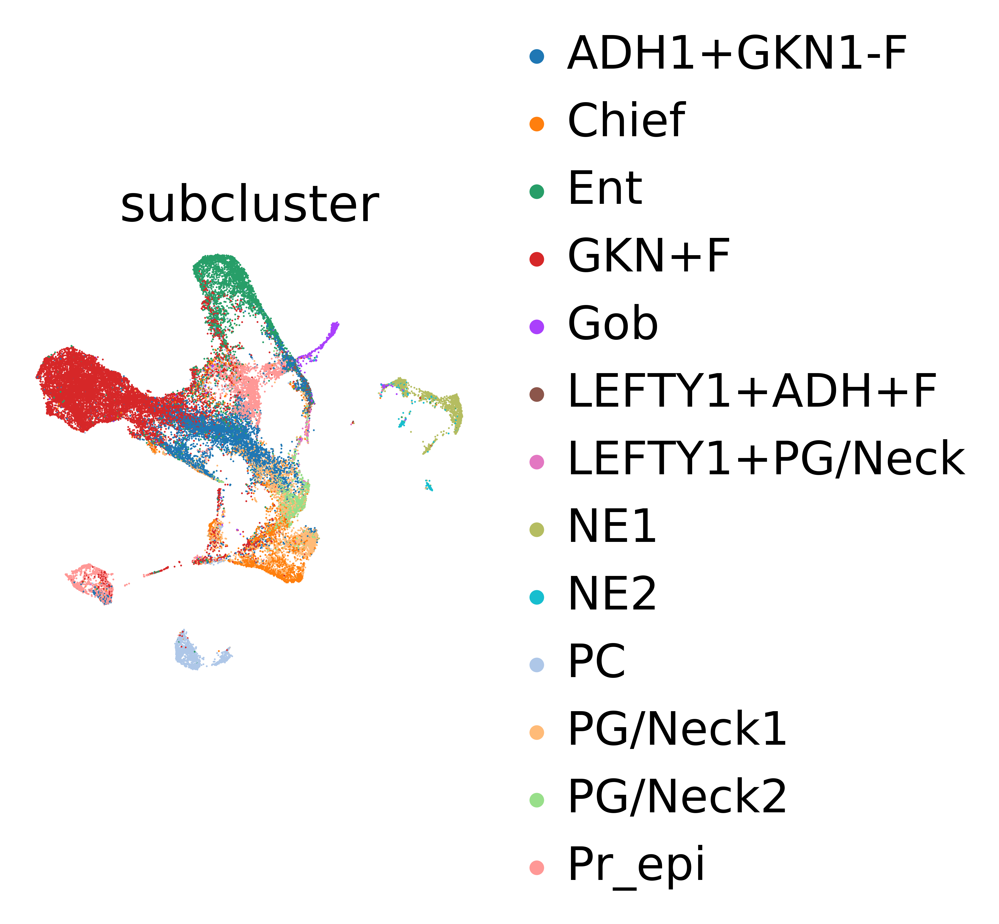

In [533]:
sc.pl.umap(adata, color=['subcluster'] )

In [534]:
COLORS = [color['color'] for color in mpl.rcParams["axes.prop_cycle"]]

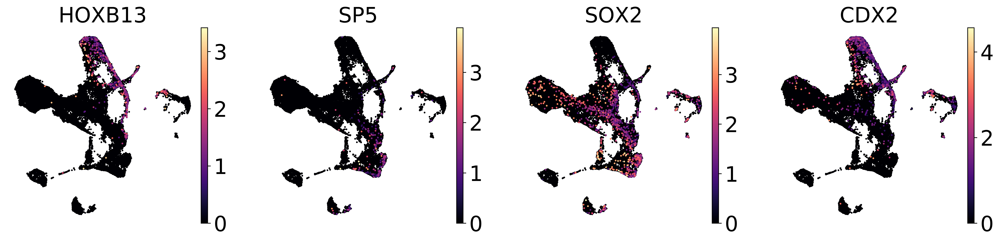

In [538]:
sc.set_figure_params(frameon=False, dpi=300, fontsize=24)
sc.pl.umap(adata, color=[ 'HOXB13', 'SP5','SOX2','CDX2'],size=15,
           title=[ 'HOXB13', 'SP5','SOX2','CDX2'],
           ncols=10, use_raw=False,
         palette=COLORS, cmap='magma')